# Base de données de l'étude 

## Phase 1: Récupération et Visualisation des Régions de France

Ce code télécharge les données géographiques des régions françaises, calcule leurs centroïdes et affiche une carte. Les centroïdes sont extraits pour chaque région et stockés sous forme de triplets (region, longitude, latitude) pour une utilisation ultérieure.

In [1]:
#Installation des bibliothèques nécessaires pour la récupération et la représentation des données géographiques
!pip install contextily && geopandas &&  topojson && py7zr && openpyxl && tqdm && s3fs && pandas && fiona && shapely && pyproj && rtree
!pip install PyYAML xlrd && git+https://github.com/inseefrlab/cartiflette && git+https://github.com/inseeFrLab/cartiflette.git && openmeteo-requests
!pip install requests-cache retry-requests 
!pip install geopandas 
!pip install cartiflette

Defaulting to user installation because normal site-packages is not writeable


'geopandas' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.


Defaulting to user installation because normal site-packages is not writeable

'git+https:' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.



Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt

In [3]:
# Récupératoin des données 

from cartiflette import carti_download

france = carti_download(
    values=["France"],
    crs=4326,
    borders="REGION",
    vectorfile_format="geojson",
    simplification=50,
    filter_by="FRANCE_ENTIERE",
    source="EXPRESS-COG-CARTO-TERRITOIRE",
    year=2022,
)


In [4]:
france.head()

,INSEE_REG,PAYS,LIBELLE_REGION,POPULATION,SOURCE,geometry
0,1,France,Guadeloupe,384239,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-61.62648 16.27275, -61.62658 ..."
1,3,France,Guyane,281678,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-51.6408 4.21282, -51.64144 4...."
2,2,France,Martinique,364508,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-60.93246 14.7306, -60.9326 14..."
3,6,France,Mayotte,256518,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((45.08357 -12.96139, 45.08547 -..."
4,84,France,Auvergne-Rhône-Alpes,8042936,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"POLYGON ((6.06386 46.41639, 6.06267 46.4168, 6..."


In [5]:
print(france.crs)

EPSG:4326


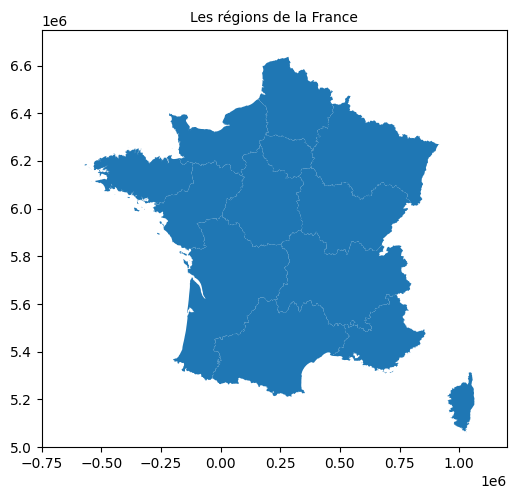

In [6]:
#REPRESENTATION 

if france.crs.to_string() != "EPSG:3857":
    france = france.to_crs(epsg=3857)
#Les  limites de la carte
xmin, xmax = -0.75e6, 1.2e6  # Convertir les limites en mètres (EPSG:3857)
ymin, ymax = 5e6, 6.75e6

#Ploting
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
france.plot(ax=ax)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
plt.title("Les régions de la France", fontsize=10)
plt.show()


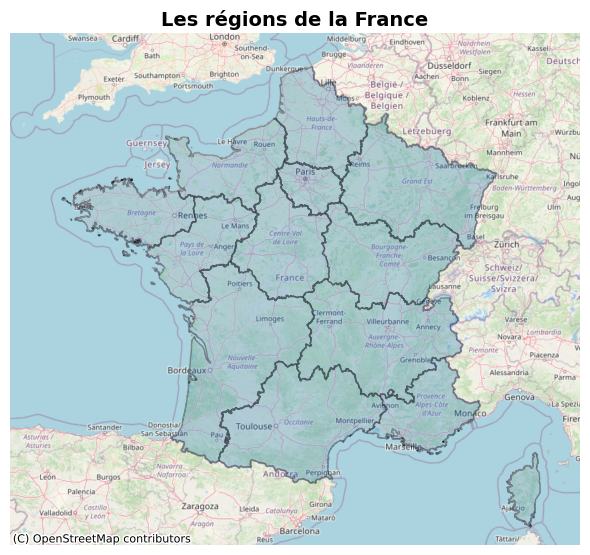

In [7]:
# Ajout d'un fond de carte pour un meilleur contexte géographique
fig, ax = plt.subplots(1, 1, figsize=(6, 6)) 
france.plot(ax=ax, edgecolor='black', linewidth=1, alpha=0.3)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
# 
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=france.crs)
#
plt.title("Les régions de la France", fontsize=14, fontweight='bold')
ax.axis('off') 

plt.tight_layout() 
plt.show()


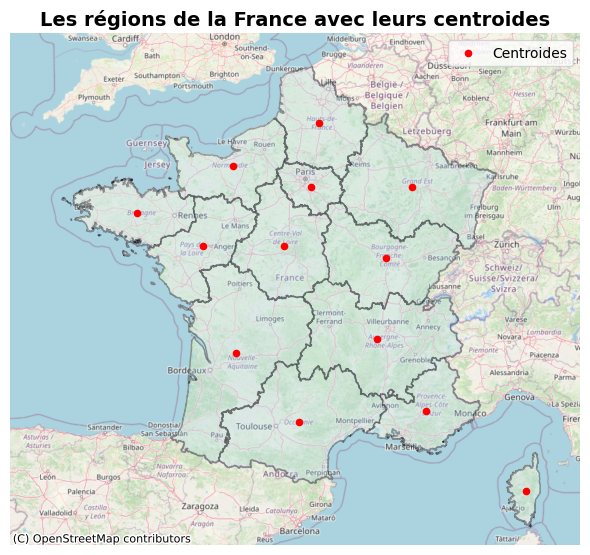

In [8]:
#Représentation des centroides 
france['centroid'] = france.geometry.centroid
france['longitude'] = france.centroid.x
france['latitude'] = france.centroid.y
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
france.plot(ax=ax, edgecolor='black', linewidth=1, alpha=0.3, color='lightblue')
ax.scatter(france['longitude'], france['latitude'], color='red', s=20, label='Centroides')
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=france.crs)
plt.title("Les régions de la France avec leurs centroides", fontsize=14, fontweight='bold')
ax.axis('off')
ax.legend()
plt.tight_layout()
plt.show()

In [9]:
# Calcul des longitudes et latitudes 
france = france.to_crs(epsg=4326)
france['longitude'] = france.geometry.centroid.x
france['latitude'] = france.geometry.centroid.y
print(france[['LIBELLE_REGION', 'longitude', 'latitude']])


                LIBELLE_REGION  longitude   latitude
0                   Guadeloupe -61.539833  16.197646
1                       Guyane -53.239940   3.915167
2                   Martinique -61.019379  14.654871
3                      Mayotte  45.147435 -12.820617
4         Auvergne-Rhône-Alpes   4.536119  45.514642
5                    Occitanie   2.143923  43.702500
6                     Bretagne  -2.841463  48.177549
7           Nouvelle-Aquitaine   0.212719  45.206040
8                    Normandie   0.110932  49.120067
9   Provence-Alpes-Côte d'Azur   6.061005  43.958789
10            Pays de la Loire  -0.816786  47.478104
11                   Grand Est   5.613112  48.688977
12     Bourgogne-Franche-Comté   4.806857  47.234282
13               Île-de-France   2.503401  48.709316
14         Centre-Val de Loire   1.684391  47.484775
15             Hauts-de-France   2.771303  49.969594
16                       Corse   9.106152  42.151511
17                  La Réunion  55.532509 -21.

C:\Users\Dell\AppData\Local\Temp\ipykernel_13624\2487130668.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  france['longitude'] = france.geometry.centroid.x
C:\Users\Dell\AppData\Local\Temp\ipykernel_13624\2487130668.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  france['latitude'] = france.geometry.centroid.y


In [10]:
france.head()

,INSEE_REG,PAYS,LIBELLE_REGION,POPULATION,SOURCE,geometry,centroid,longitude,latitude
0,1,France,Guadeloupe,384239,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-61.62648 16.27275, -61.62658 ...",POINT (-6850582.542 1827642.261),-61.539833,16.197646
1,3,France,Guyane,281678,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-51.6408 4.21282, -51.64144 4....",POINT (-5926644.81 436331.726),-53.239940,3.915167
2,2,France,Martinique,364508,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-60.93246 14.7306, -60.9326 14...",POINT (-6792650.367 1649468.223),-61.019379,14.654871
3,6,France,Mayotte,256518,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((45.08357 -12.96139, 45.08547 -...",POINT (5025789.843 -1439250.269),45.147435,-12.820617
4,84,France,Auvergne-Rhône-Alpes,8042936,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"POLYGON ((6.06386 46.41639, 6.06267 46.4168, 6...",POINT (504837.95 5704315.458),4.536119,45.514642


In [11]:
# Création de la liste de triplets (région, longitude, latitude)
region_centroides = []
for index, row in france.iterrows():
    region = row['LIBELLE_REGION']  # Nom de la région
    longitude = row['longitude']  # Longitude du centroïde
    latitude = row['latitude']    # Latitude du centroïde
    region_centroides.append((region, longitude, latitude)) # Ajout du triplet à la liste
region_centroides

[('Guadeloupe', -61.539833041077834, 16.1976458265529),
 ('Guyane', -53.23993971851178, 3.915166862499844),
 ('Martinique', -61.01937874077369, 14.654870858984367),
 ('Mayotte', 45.14743542382147, -12.820616875536656),
 ('Auvergne-Rhône-Alpes', 4.536118586333609, 45.51464202656836),
 ('Occitanie', 2.1439228339376544, 43.70250024549978),
 ('Bretagne', -2.8414626764658864, 48.17754922086024),
 ('Nouvelle-Aquitaine', 0.21271860548694319, 45.20603953960883),
 ('Normandie', 0.11093239896467046, 49.12006667987378),
 ("Provence-Alpes-Côte d'Azur", 6.0610045225522295, 43.95878857291766),
 ('Pays de la Loire', -0.8167859826189401, 47.478103544872866),
 ('Grand Est', 5.613112231600144, 48.68897740160864),
 ('Bourgogne-Franche-Comté', 4.80685691530116, 47.23428194519943),
 ('Île-de-France', 2.50340139255276, 48.709315501090735),
 ('Centre-Val de Loire', 1.684391322381998, 47.48477508284456),
 ('Hauts-de-France', 2.7713028658475456, 49.96959396126242),
 ('Corse', 9.106151755156157, 42.151511375620

# Phase 2: Collecte des Données de Qualité de l'Air

Ce script collecte des **données horaires de qualité de l'air** via l'API Open-Meteo pour différentes régions. 
Il récupère les polluants clés (**PM10**, **PM2.5**, **CO**, **NO₂**, **SO₂**, **Ozone**)  et quelques données sur le climat
et les organise dans un tableau structuré.

---

## **Fonctionnalités**
- Utilisation d'un **cache** et de **répétitions automatiques** pour des requêtes fiables.
- Organisation des données dans des **DataFrames pandas**.
- Ajout d'une colonne pour **extraire les dates** sans les heures.
- Fusion des données pour une **analyse centralisée**.





In [12]:
from scripts import api
from scripts.api import recup_data
var_air=["pm10", "pm2_5", "carbon_dioxide", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]
combined_dataframe_air = api.recup_data("2023-01-01","2024-11-30","https://air-quality-api.open-meteo.com/v1/air-quality",var_air,region_centroides)

In [13]:
combined_dataframe_air

,date,day,region,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone
0,2023-01-01 00:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.500000,11.3,NaN,3.70,0.30,62.0
1,2023-01-01 01:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.700001,11.9,NaN,3.45,0.30,62.0
2,2023-01-01 02:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.799999,12.0,NaN,3.15,0.25,63.0
3,2023-01-01 03:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.700001,11.4,NaN,2.60,0.25,64.0
4,2023-01-01 04:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,19.400000,10.7,NaN,2.10,0.25,64.0
...,...,...,...,...,...,...,...,...,...,...,...
302395,2024-11-30 19:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,10.000000,7.1,459.0,3.60,2.50,56.0
302396,2024-11-30 20:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.800000,7.1,455.0,4.20,2.30,52.0
302397,2024-11-30 21:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.700000,7.0,453.0,4.50,2.20,49.0
302398,2024-11-30 22:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.500000,6.9,455.0,4.40,2.10,47.0


In [14]:
var_climat=["temperature_2m", "relative_humidity_2m", "precipitation", "surface_pressure", "wind_speed_10m"]
combined_dataframe_climat = api.recup_data("2023-01-01","2024-11-30","https://archive-api.open-meteo.com/v1/archive",var_climat,region_centroides)
combined_dataframe_climat = combined_dataframe_climat.drop(columns=["region","date","day"])

In [15]:
df_hourly=pd.concat([combined_dataframe_air,combined_dataframe_climat],axis=1)
df_hourly

,date,day,region,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,2023-01-01 00:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.500000,11.3,NaN,3.70,0.30,62.0,-61.539833,16.197646,23.770000,84.863304,0.0,1017.400024,9.422101
1,2023-01-01 01:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.700001,11.9,NaN,3.45,0.30,62.0,-61.539833,16.197646,23.719999,85.643173,0.0,1017.599976,9.885262
2,2023-01-01 02:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.799999,12.0,NaN,3.15,0.25,63.0,-61.539833,16.197646,23.520000,86.947586,0.0,1017.700012,9.720000
3,2023-01-01 03:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.700001,11.4,NaN,2.60,0.25,64.0,-61.539833,16.197646,23.270000,88.269188,0.0,1017.400024,7.559999
4,2023-01-01 04:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,19.400000,10.7,NaN,2.10,0.25,64.0,-61.539833,16.197646,22.469999,94.082932,0.2,1017.299988,8.825508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302395,2024-11-30 19:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,10.000000,7.1,459.0,3.60,2.50,56.0,55.532509,-21.133203,10.291500,93.833534,0.0,824.523071,3.617955
302396,2024-11-30 20:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.800000,7.1,455.0,4.20,2.30,52.0,55.532509,-21.133203,9.891500,93.814590,0.0,823.957458,3.847960
302397,2024-11-30 21:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.700000,7.0,453.0,4.50,2.20,49.0,55.532509,-21.133203,9.391500,97.342743,0.0,823.007019,3.065289
302398,2024-11-30 22:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.500000,6.9,455.0,4.40,2.10,47.0,55.532509,-21.133203,8.891500,99.663048,0.0,822.137085,2.979530


In [64]:
#df_hourly=df_hourly.drop_duplicates()


In [16]:
# Agrégation par 'day' et 'region' en prenant la moyenne
df = df_hourly.groupby(['day', 'region']).mean().reset_index()

# 📊 ANALYSE EXPLORATOIRE

Cette analyse explore les données en **panel** afin de comprendre les tendances, les relations entre variables et les spécificités régionales et temporelles. 

Elle sert également de base à la préparation des données pour la modélisation prédictive.

---

## **1. Exploration de base des données**

### 🔍 **Statistiques descriptives globales**

### 🌍 Filtrage des Données : Régions Européennes

Dans cette étape, nous avons filtré les données pour ne conserver que les régions françaises situées en Europe. Ce filtrage est essentiel pour se concentrer sur les régions métropolitaines et éviter de mélanger les données avec celles des régions d'outre-mer.

---

#### **1. Liste des Régions Européennes**
Voici les 13 régions métropolitaines françaises incluses dans l'analyse :

1. Auvergne-Rhône-Alpes  
2. Bourgogne-Franche-Comté  
3. Bretagne  
4. Centre-Val de Loire  
5. Corse  
6. Grand Est  
7. Hauts-de-France  
8. Île-de-France  
9. Normandie  
10. Nouvelle-Aquitaine  
11. Occitanie  
12. Pays de la Loire  
13. Provence-Alpes-Côte d'Azur  

In [17]:

regions_europe = ["Auvergne-Rhône-Alpes","Bourgogne-Franche-Comté","Bretagne","Centre-Val de Loire","Corse","Grand Est","Hauts-de-France","Île-de-France","Normandie","Nouvelle-Aquitaine","Occitanie","Pays de la Loire",
    "Provence-Alpes-Côte d'Azur"
]

# Filtrage des régions européennes
df1 = df[df['region'].isin(regions_europe)]



In [18]:
df1.head()

,day,region,date,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,2023-01-01,Auvergne-Rhône-Alpes,2023-01-01 11:30:00+00:00,4.536119,45.514642,14.954166,7.858334,NaN,3.475000,0.837500,62.250000,4.536119,45.514642,11.954083,71.024551,0.000000,964.791809,23.574928
1,2023-01-01,Bourgogne-Franche-Comté,2023-01-01 11:30:00+00:00,4.806857,47.234282,13.300000,7.737500,NaN,3.795833,0.741667,59.541668,4.806857,47.234282,10.743833,77.391754,0.000000,963.939941,20.494823
2,2023-01-01,Bretagne,2023-01-01 11:30:00+00:00,-2.841463,48.177549,9.845834,5.720833,NaN,3.395833,0.270833,64.916664,-2.841463,48.177549,10.547750,89.859863,0.358333,998.909729,18.512320
3,2023-01-01,Centre-Val de Loire,2023-01-01 11:30:00+00:00,1.684391,47.484775,13.750000,7.679167,NaN,2.837500,0.770833,52.958332,1.684391,47.484775,14.431666,66.970406,0.000000,1004.533508,18.958830
4,2023-01-01,Corse,2023-01-01 11:30:00+00:00,9.106152,42.151511,8.979167,5.345833,NaN,2.208333,0.341667,52.833332,9.106152,42.151511,6.793917,73.633392,0.000000,841.699280,4.792229


In [68]:
df1.shape

(9100, 18)

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9100 entries, 0 to 12599
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   day                   9100 non-null   object             
 1   region                9100 non-null   object             
 2   date                  9100 non-null   datetime64[ns, UTC]
 3   longitude             9100 non-null   float64            
 4   latitude              9100 non-null   float64            
 5   pm10                  9100 non-null   float32            
 6   pm2_5                 9100 non-null   float32            
 7   carbon_dioxide        468 non-null    float32            
 8   nitrogen_dioxide      9100 non-null   float32            
 9   sulphur_dioxide       9100 non-null   float32            
 10  ozone                 9100 non-null   float32            
 11  longitude             9100 non-null   float64            
 12  latitude  

####  🔍 Vérification de la structure des données panel

Nous allons vérifier si chaque combinaison region et day est unique

In [18]:
print(df1.groupby(['region', 'day']).size())
duplicates = df1.groupby(['region', 'day']).size()
print((duplicates > 1).sum())  # Vérifie combien de combinaisons ont plus d'une observation

region                day       
Auvergne-Rhône-Alpes  2023-01-01    1
                      2023-01-02    1
                      2023-01-03    1
                      2023-01-04    1
                      2023-01-05    1
                                   ..
Île-de-France         2024-11-26    1
                      2024-11-27    1
                      2024-11-28    1
                      2024-11-29    1
                      2024-11-30    1
Length: 9100, dtype: int64
0


### 🔍 Valeurs manquantes

In [19]:
df1.isnull().sum() / len(df1) * 100

day                      0.000000
region                   0.000000
date                     0.000000
longitude                0.000000
latitude                 0.000000
pm10                     0.000000
pm2_5                    0.000000
carbon_dioxide          94.857143
nitrogen_dioxide         0.000000
sulphur_dioxide          0.000000
ozone                    0.000000
longitude                0.000000
latitude                 0.000000
temperature_2m           0.000000
relative_humidity_2m     0.000000
precipitation            0.000000
surface_pressure         0.000000
wind_speed_10m           0.000000
dtype: float64

### **2. Observations Clés**
1. **Absence de valeurs manquantes** :  
   - La majorité des variables ne contiennent **aucune valeur manquante**, ce qui garantit une bonne qualité des données pour ces dimensions.

2. **Problème majeur avec `carbon_dioxide`** :  
   - Cette variable présente **94.86% de valeurs manquantes**, ce qui rend son utilisation directe problématique.
   - Nous allons donc supprimer cette colonne .

In [20]:
df1 = df1.drop(columns="carbon_dioxide")
df_hourly =df_hourly.drop(columns="carbon_dioxide")

## 🌍 Phase 3: Calcul de l'Indice ATMO

L'**indice ATMO** est utilisé en France pour évaluer la qualité de l'air en se basant sur cinq principaux polluants : **PM10**, **PM2.5**, **NO₂**, **O₃**, et **SO₂**. 

Il synthétise ces données en un indicateur unique, simple à interpréter.

---

### 🛠️ **Méthode de Calcul**

#### **1. Calcul des Sous-Indices**
Chaque polluant se voit attribuer un **sous-indice** en fonction de sa concentration moyenne journalière 

(ou glissante pour certains polluants). Les seuils sont définis comme suit :

| **Sous-indice** | **PM10 (µg/m³)** | **PM2.5 (µg/m³)** | **NO₂ (µg/m³)** | **O₃ (µg/m³)** | **SO₂ (µg/m³)** |
|-----------------|------------------|-------------------|-----------------|----------------|-----------------|
| 1 (Très bon)   | 0 - 6            | 0 - 5             | 0 - 29          | 0 - 29         | 0 - 39          |
| 2              | 7 - 13           | 6 - 10            | 30 - 54         | 30 - 54        | 40 - 79         |
| 3              | 14 - 20          | 11 - 15           | 55 - 84         | 55 - 79        | 80 - 119        |
| 4              | 21 - 27          | 16 - 20           | 85 - 109        | 80 - 104       | 120 - 159       |
| 5              | 28 - 34          | 21 - 25           | 110 - 134       | 105 - 129      | 160 - 199       |
| 6              | 35 - 41          | 26 - 30           | 135 - 164       | 130 - 149      | 200 - 249       |
| 7              | 42 - 49          | 31 - 40           | 165 - 199       | 150 - 179      | 250 - 299       |
| 8              | 50 - 64          | 41 - 50           | 200 - 274       | 180 - 209      | 300 - 399       |
| 9              | 65 - 79          | 51 - 75           | 275 - 399       | 210 - 239      | 400 - 499       |
| 10 (Très mauvais) | ≥ 80          | ≥ 76              | ≥ 400           | ≥ 240          | ≥ 500           |

#### **2. Détermination de l'Indice Final**
L'**indice ATMO** correspond au **sous-indice le plus élevé** parmi les cinq polluants mesurés sur une journée. 

Cela signifie que le polluant le plus préoccupant domine l'indicateur global.

---

### 📊 **Échelle de Qualité de l'Air**

| **Indice ATMO** | **Niveau de Qualité** | **Couleur Associée** |
|------------------|-----------------------|-----------------------|
| 1-2             | Très bon              | 🟢 Vert clair         |
| 3-4             | Bon                   | 🟢 Vert               |
| 5               | Moyen                 | 🟡 Jaune              |
| 6-7             | Médiocre              | 🟠 Orange             |
| 8-9             | Mauvais               | 🔴 Rouge              |
| 10              | Très mauvais          | 🟣 Violet             |

---

### 🔗 **Référence Officielle**
Pour plus de détails, consultez la page officielle de l'indice ATMO sur [Atmo France](https://www.atmo-france.org/article/lindice-atmo).

---


In [ ]:
import pandas as pd
from scripts import indice
# Convert 'date' and 'day' columns to datetime
df1['date'] = pd.to_datetime(df1['date'])
df1['day'] = pd.to_datetime(df1['day'])

# Sort data by 'region', 'day', and 'date'
df1 = df1.sort_values(by=['region', 'day', 'date'])

# Define functions to compute sub-indices for each pollutant
def get_subindex_pm10(value):
    if value <= 6: return 1
    elif value <= 13: return 2
    elif value <= 20: return 3
    elif value <= 27: return 4
    elif value <= 34: return 5
    elif value <= 41: return 6
    elif value <= 49: return 7
    elif value <= 64: return 8
    elif value <= 79: return 9
    else: return 10

def get_subindex_pm2_5(value):
    if value <= 5: return 1
    elif value <= 10: return 2
    elif value <= 15: return 3
    elif value <= 20: return 4
    elif value <= 25: return 5
    elif value <= 30: return 6
    elif value <= 40: return 7
    elif value <= 50: return 8
    elif value <= 75: return 9
    else: return 10

def get_subindex_no2(value):
    if value <= 29: return 1
    elif value <= 54: return 2
    elif value <= 84: return 3
    elif value <= 109: return 4
    elif value <= 134: return 5
    elif value <= 164: return 6
    elif value <= 199: return 7
    elif value <= 274: return 8
    elif value <= 399: return 9
    else: return 10

def get_subindex_o3(value):
    if value <= 29: return 1
    elif value <= 54: return 2
    elif value <= 79: return 3
    elif value <= 104: return 4
    elif value <= 129: return 5
    elif value <= 149: return 6
    elif value <= 179: return 7
    elif value <= 209: return 8
    elif value <= 239: return 9
    else: return 10

def get_subindex_so2(value):
    if value <= 39: return 1
    elif value <= 79: return 2
    elif value <= 119: return 3
    elif value <= 159: return 4
    elif value <= 199: return 5
    elif value <= 249: return 6
    elif value <= 299: return 7
    elif value <= 399: return 8
    elif value <= 499: return 9
    else: return 10

# Calcul des moyennes journalières pour toutes les variables
daily_data = df_hourly.groupby(['day', 'region']).agg({
    'pm10': 'mean',
    'pm2_5': 'mean',
    'nitrogen_dioxide': 'mean',
    'ozone': lambda x: x.rolling(8, min_periods=1).mean().max(),  # Max sur 8h glissantes
    'sulphur_dioxide': 'mean',
    **{col: 'mean' for col in df_hourly.columns if col not in ['date', 'day', 'region', 'pm10', 'pm2_5', 'nitrogen_dioxide', 'ozone', 'sulphur_dioxide']}
}).reset_index()

# Calcul des sous-indices
daily_data['subindex_pm10'] = daily_data['pm10'].apply(get_subindex_pm10)
daily_data['subindex_pm2_5'] = daily_data['pm2_5'].apply(get_subindex_pm2_5)
daily_data['subindex_no2'] = daily_data['nitrogen_dioxide'].apply(get_subindex_no2)
daily_data['subindex_o3'] = daily_data['ozone'].apply(get_subindex_o3)
daily_data['subindex_so2'] = daily_data['sulphur_dioxide'].apply(get_subindex_so2)

# Calcul de l'indice Atmo final
daily_data['indice_atmo'] = daily_data[[
    'subindex_pm10', 'subindex_pm2_5', 'subindex_no2', 'subindex_o3', 'subindex_so2'
]].max(axis=1)

# Fusion avec le DataFrame original pour conserver uniquement les colonnes de df
df_final = df_hourly[['day', 'region']].drop_duplicates().merge(daily_data, on=['day', 'region'], how='left')
# Filtrage des régions européennes
df_final = df_final[df_final['region'].isin(regions_europe)]
# Affichage du résultat final
df_final


AttributeError: 'DataFrame' object has no attribute 'name'

In [25]:
from scripts import indice
df_final = indice.atmo(df_hourly=df_hourly)

AttributeError: 'DataFrame' object has no attribute 'name'

In [27]:
df_final.describe()

,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,carbon_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,longitude,latitude,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
count,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,468.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.00000,9100.0,9100.000000
mean,10.907528,7.113768,4.518834,74.675422,0.442049,451.454071,12.377439,76.972610,0.120589,977.221863,11.768193,2.760897,46.722780,2.212088,1.888681,1.003626,3.31989,1.0,3.498791
std,6.222834,4.548127,4.211990,17.035211,0.446411,10.652415,6.485336,11.364951,0.240779,48.221287,5.837454,3.112592,2.304779,0.929465,0.981320,0.060113,0.74320,0.0,0.790160
min,1.141667,0.850000,0.508333,17.125000,0.000000,437.875000,-7.760250,20.433760,0.000000,806.494568,1.490240,-2.841463,42.151511,1.000000,1.000000,1.000000,1.00000,1.0,2.000000
25%,6.933333,4.200000,2.070833,64.250000,0.166667,443.166656,7.808958,70.551474,0.000000,961.561111,7.297564,0.212719,45.206040,2.000000,1.000000,1.000000,3.00000,1.0,3.000000
50%,9.341666,5.795834,3.135417,73.875000,0.308333,449.312500,12.212584,78.623955,0.016667,994.546631,10.590815,2.503401,47.478104,2.000000,2.000000,1.000000,3.00000,1.0,3.000000
75%,13.070834,8.529166,5.433333,84.781250,0.562500,455.854187,17.388834,85.422457,0.137500,1006.645447,15.156949,4.806857,48.688977,3.000000,2.000000,1.000000,4.00000,1.0,4.000000
max,83.650002,42.333332,52.420834,161.500000,6.408333,511.250000,30.983335,99.779869,3.450000,1038.322388,41.020008,9.106152,49.969594,10.000000,8.000000,2.000000,7.00000,1.0,10.000000


### 📊 Statistiques Descriptives des Régions Européennes

Les statistiques ci-dessous présentent un résumé des variables clés collectées pour les 13 régions métropolitaines françaises sur la période donnée.

---

#### **1. Pollution Atmosphérique**

| **Variable**            | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|--------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **PM10** (µg/m³)         | 9,100     | 10.91    | 6.22     | 1.14      | 6.93      | 9.34      | 13.07     | 83.65     |
| **PM2.5** (µg/m³)        | 9,100     | 7.11     | 4.55     | 0.85      | 4.20      | 5.80      | 8.53      | 42.33     |
| **Dioxyde d'Azote** (µg/m³) | 9,100  | 4.52     | 4.21     | 0.51      | 2.07      | 3.14      | 5.43      | 52.42     |
| **Ozone** (µg/m³)        | 9,100     | 74.68    | 17.03    | 17.13     | 64.25     | 73.88     | 84.78     | 161.50    |
| **Dioxyde de Soufre** (µg/m³) | 9,100 | 0.44     | 0.45     | 0.00      | 0.17      | 0.31      | 0.56      | 6.41      |
| **Monoxyde de Carbone** (µg/m³) | 9,100 | 154.63 | 31.88    | 87.92     | 132.86    | 150.21    | 169.46    | 428.00    |
---

#### **2. Variables Météorologiques**

| **Variable**                | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|-----------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Température à 2m** (°C)   | 9,100     | 12.38    | 6.49     | -7.76     | 7.81      | 12.21     | 17.39     | 30.98     |
| **Humidité Relative** (%)   | 9,100     | 76.97    | 11.36    | 20.43     | 70.55     | 78.62     | 85.42     | 99.78     |
| **Pression au Sol** (hPa)   | 9,100     | 977.22   | 48.22    | 806.49    | 961.56    | 994.55    | 1006.65   | 1038.32   |
| **Vent à 10m** (m/s)        | 9,100     | 11.77    | 5.84     | 1.49      | 7.30      | 10.59     | 15.16     | 41.02     |

---

#### **3. Variables du Sol**

| **Variable**                       | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|------------------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Température du Sol (0-7cm)** (°C)| 9,100     | 12.68    | 6.60     | -3.18     | 7.90      | 12.43     | 17.87     | 31.14     |
| **Humidité du Sol (0-7cm)** (m³/m³)| 9,100     | 0.33     | 0.08     | 0.06      | 0.28      | 0.35      | 0.39      | 0.51      |

---

#### **4. Sous-Indices et Indice ATMO**

| **Variable**            | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|--------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Sous-indice PM10**     | 9,100     | 2.21     | 0.93     | 1.00      | 2.00      | 2.00      | 3.00      | 10.00     |
| **Sous-indice PM2.5**    | 9,100     | 1.89     | 0.98     | 1.00      | 1.00      | 2.00      | 2.00      | 8.00      |
| **Sous-indice NO2**      | 9,100     | 1.00     | 0.06     | 1.00      | 1.00      | 1.00      | 1.00      | 2.00      |
| **Sous-indice O3**       | 9,100     | 3.32     | 0.74     | 1.00      | 3.00      | 3.00      | 4.00      | 7.00      |
| **Sous-indice SO2**      | 9,100     | 1.00     | 0.00     | 1.00      | 1.00      | 1.00      | 1.00      | 1.00      |
| **Indice ATMO**          | 9,100     | 3.50     | 0.79     | 2.00      | 3.00      | 3.00      | 4.00      | 10.00     |

---

#### **Observations Clés**
1. **Polluants :**
   - Les **PM10** et **PM2.5** ont des moyennes modérées mais des maximums élevés, reflétant des pics de pollution dans certaines régions.
   - Les sous-indices pour le **dioxyde de soufre** restent constants à `1`, indiquant des concentrations très faibles dans toutes les régions.

2. **Météorologie :**
   - La **température moyenne** à 2m est d'environ 12.4°C, avec des variations saisonnières marquées.
   - Le vent est modéré en moyenne, mais des rafales atteignant 41 m/s ont été observées.

3. **Indice ATMO :**
   - La majorité des jours ont un indice ATMO de `3` ou `4`, correspondant à une qualité de l'air moyenne ou légèrement médiocre.
   - Quelques jours présentent un indice ATMO élevé (`10`), indiquant une qualité de l'air très mauvaise.



In [21]:
df_final=df1

In [22]:
df1.insert(1,"month",df["date"].dt.month)
month_dict = {
    1: 'janvier', 2: 'février', 3: 'mars', 4: 'avril', 5: 'mai', 
    6: 'juin', 7: 'juillet', 8: 'août', 9: 'septembre', 10: 'octobre', 
    11: 'novembre', 12: 'décembre'
}

In [23]:
df1.head()

,day,month,region,date,longitude,latitude,pm10,pm2_5,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,2023-01-01,1,Auvergne-Rhône-Alpes,2023-01-01 11:30:00+00:00,4.536119,45.514642,14.954166,7.858334,3.475000,0.837500,62.250000,4.536119,45.514642,11.954083,71.024551,0.000000,964.791809,23.574928
1,2023-01-01,1,Bourgogne-Franche-Comté,2023-01-01 11:30:00+00:00,4.806857,47.234282,13.300000,7.737500,3.795833,0.741667,59.541668,4.806857,47.234282,10.743833,77.391754,0.000000,963.939941,20.494823
2,2023-01-01,1,Bretagne,2023-01-01 11:30:00+00:00,-2.841463,48.177549,9.845834,5.720833,3.395833,0.270833,64.916664,-2.841463,48.177549,10.547750,89.859863,0.358333,998.909729,18.512320
3,2023-01-01,1,Centre-Val de Loire,2023-01-01 11:30:00+00:00,1.684391,47.484775,13.750000,7.679167,2.837500,0.770833,52.958332,1.684391,47.484775,14.431666,66.970406,0.000000,1004.533508,18.958830
4,2023-01-01,1,Corse,2023-01-01 11:30:00+00:00,9.106152,42.151511,8.979167,5.345833,2.208333,0.341667,52.833332,9.106152,42.151511,6.793917,73.633392,0.000000,841.699280,4.792229


### 📈    Visualisation des Tendances Temporelles des Polluants Atmosphériques

In [24]:
polluants = ['pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide']
time_trends = df_final.groupby('day')[polluants].mean()

In [25]:
import seaborn as sns

C:\Users\Dell\AppData\Local\Temp\ipykernel_13624\3816821301.py:32: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


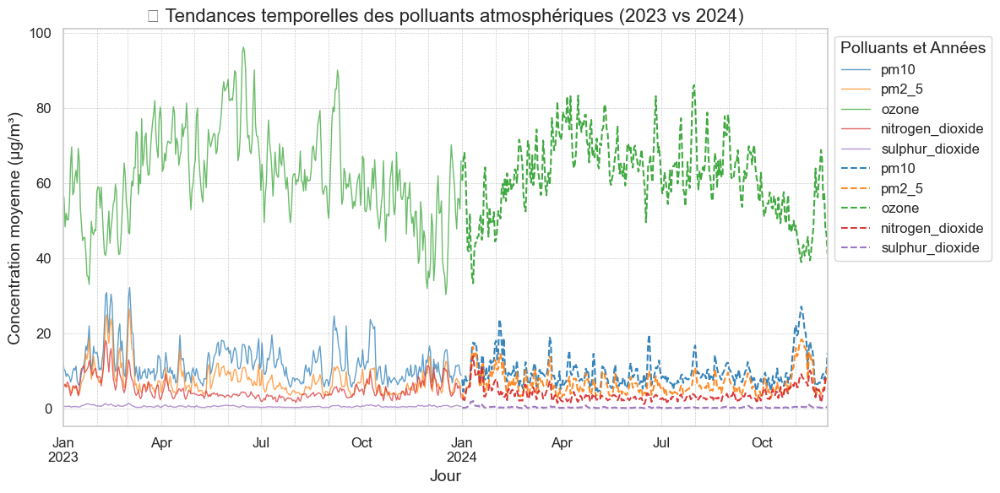

In [26]:
time_trends.index = pd.to_datetime(time_trends.index)
time_trends_2023 = time_trends.loc['2023-01-01':'2023-12-31']
time_trends_2024 = time_trends.loc['2024-01-01':'2024-12-31']
sns.set_theme(style="whitegrid")
plt.figure(figsize=(12, 6))

# Traçage des tendances pour 2023
time_trends_2023.plot(
    ax=plt.gca(),
    linewidth=1,
    linestyle="-",  # Ligne pleine pour 2023
    alpha=0.7,
    color=sns.color_palette("tab10", n_colors=len(polluants)),
    label=[f"{pollutant} (2023)" for pollutant in polluants]
)
# Traçage des tendances pour 2024
time_trends_2024.plot(
    ax=plt.gca(),
    linewidth=1.5,
    linestyle="--",  # Ligne pointillée pour 2024
    alpha=0.9,
    color=sns.color_palette("tab10", n_colors=len(polluants)),
    label=[f"{pollutant} (2024)" for pollutant in polluants]
)
plt.title("📈 Tendances temporelles des polluants atmosphériques (2023 vs 2024)", fontsize=16)
plt.xlabel("Jour", fontsize=14)
plt.ylabel("Concentration moyenne (µg/m³)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title="Polluants et Années", fontsize=12, title_fontsize=14, loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(visible=True, which="both", linestyle="--", linewidth=0.5)
plt.tight_layout()
plt.show()


1. **Ozone (O₃)** :
   - Les concentrations d'ozone suivent une **forte saisonnalité**, atteignant des pics au printemps et en été. 
   - Ces pics pourraient être dus à une augmentation de la photodissociation des polluants en présence de lumière solaire intense.

2. **PM10 et PM2.5** :
   - Les concentrations de particules (PM10 et PM2.5) sont relativement stables sur l'année, avec quelques **pics sporadiques** qui pourraient être liés à des événements ponctuels, comme des feux de forêt, des émissions industrielles, ou des conditions météorologiques spécifiques (vents secs, inversion thermique).
   - Les niveaux sont légèrement plus élevés en hiver, possiblement en raison des émissions provenant du chauffage résidentiel.

3. **Dioxyde d'azote (NO₂)** :
   - Les niveaux de NO₂ sont faibles mais montrent une légère hausse en hiver. Cela pourrait être attribué à une augmentation des émissions liées au transport et au chauffage.

4. **Dioxyde de soufre (SO₂)** :
   - Les concentrations de SO₂ restent très faibles tout au long de l'année. Les faibles émissions pourraient être liées à des régulations strictes sur les combustibles fossiles contenant du soufre.

##### ✨ Comparaison entre 2023 et 2024
- **Tendances générales similaires** :
  - Les deux années montrent des profils de variation similaires, suggérant une cohérence dans les sources d'émission et les conditions météorologiques.
- **Légères différences dans les niveaux de concentration** :
  - Pour certains polluants comme l'ozone, les niveaux de 2024 semblent légèrement inférieurs à ceux de 2023, ce qui pourrait être dû à des variations climatiques ou des politiques environnementales renforcées.

##### 📌 Points Clés à Retenir
- Les concentrations d'ozone présentent une **forte saisonnalité** et des pics marqués en été.
- Les particules fines (PM10 et PM2.5) montrent des **fluctuations ponctuelles** et des niveaux légèrement plus élevés en hiver.
- Les concentrations de NO₂ et SO₂ restent relativement faibles, avec peu de variations notables.

### 🧐 Vérifions si ces tendances sont égalements observées dans chaque région

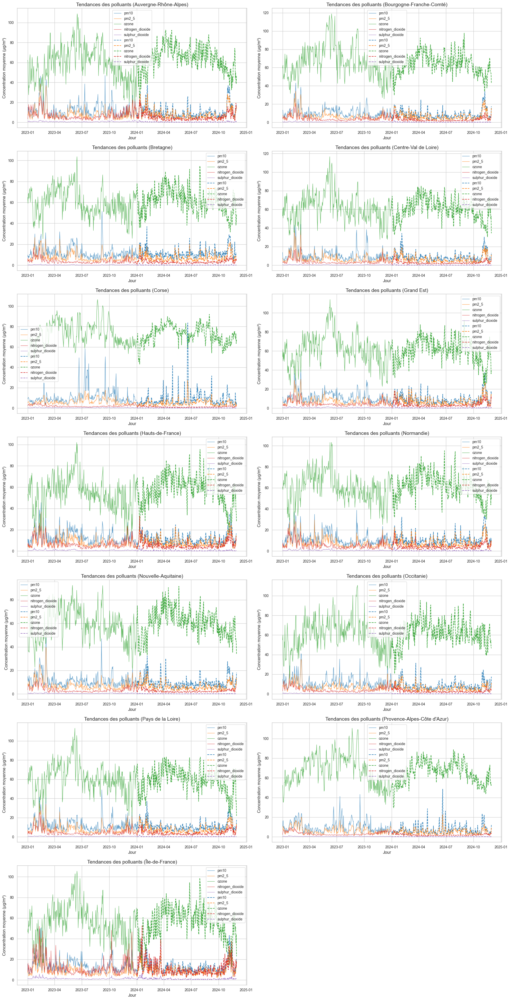

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créer le DataFrame groupé
time_trends_reg = df_final.groupby(['day', 'region'])[polluants].mean()

# Réinitialiser l'index pour faciliter la manipulation
time_trends_reg = time_trends_reg.reset_index()

# Liste unique des régions
regions = time_trends_reg['region'].unique()

sns.set_theme(style="whitegrid")

# Dimensions des sous-graphiques
fig, axes = plt.subplots(
    nrows=(len(regions) + 1) // 2,  # Calculer le nombre de lignes
    ncols=2,
    figsize=(20, len(regions) * 3)
)
axes = axes.flatten()
for i, region in enumerate(regions):
    # Filtrer les données par région
    region_data = time_trends_reg[time_trends_reg['region'] == region]

    # Filtrer les données par année
    time_trends_2023 = region_data[(region_data['day'].astype("str") >= '2023-01-01') & (region_data['day'].astype("str") <= '2023-12-31')]
    time_trends_2024 = region_data[(region_data['day'].astype("str") >= '2024-01-01') & (region_data['day'].astype("str") <= '2024-12-31')]

    # Traçage des tendances pour 2023
    time_trends_2023.set_index('day')[polluants].plot(
        ax=axes[i],
        linewidth=1,
        linestyle="-",
        alpha=0.7,
        color=sns.color_palette("tab10", n_colors=len(polluants)),
        label=[f"{pollutant} (2023)" for pollutant in polluants]
    )

    # Traçage des tendances pour 2024
    time_trends_2024.set_index('day')[polluants].plot(
        ax=axes[i],
        linewidth=1.5,
        linestyle="--",
        alpha=0.9,
        color=sns.color_palette("tab10", n_colors=len(polluants)),
        label=[f"{pollutant} (2024)" for pollutant in polluants]
    )

    # Ajuster le titre, les axes et la légende
    axes[i].set_title(f"Tendances des polluants ({region})", fontsize=14)
    axes[i].set_xlabel("Jour", fontsize=12)
    axes[i].set_ylabel("Concentration moyenne (µg/m³)", fontsize=12)
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    axes[i].legend(fontsize=10)

# Supprimer les axes inutilisés
for j in range(len(regions), len(axes)):
    fig.delaxes(axes[j])

# Ajustement global
plt.tight_layout()
plt.show()


In [32]:
region_data["day"].astype("str")

12      2023-01-01
25      2023-01-02
38      2023-01-03
51      2023-01-04
64      2023-01-05
           ...    
9047    2024-11-26
9060    2024-11-27
9073    2024-11-28
9086    2024-11-29
9099    2024-11-30
Name: day, Length: 700, dtype: object

In [33]:
type("2023-01-01")

str

In [ ]:
df1

,day,month,region,date,longitude,latitude,pm10,pm2_5,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,2023-01-01,1,Auvergne-Rhône-Alpes,2023-01-01 11:30:00+00:00,4.536119,45.514642,14.954166,7.858334,3.475000,0.837500,62.250000,4.536119,45.514642,11.954083,71.024551,0.000000,964.791809,23.574928
1,2023-01-01,1,Bourgogne-Franche-Comté,2023-01-01 11:30:00+00:00,4.806857,47.234282,13.300000,7.737500,3.795833,0.741667,59.541668,4.806857,47.234282,10.743833,77.391754,0.000000,963.939941,20.494823
2,2023-01-01,1,Bretagne,2023-01-01 11:30:00+00:00,-2.841463,48.177549,9.845834,5.720833,3.395833,0.270833,64.916664,-2.841463,48.177549,10.547750,89.859863,0.358333,998.909729,18.512320
3,2023-01-01,1,Centre-Val de Loire,2023-01-01 11:30:00+00:00,1.684391,47.484775,13.750000,7.679167,2.837500,0.770833,52.958332,1.684391,47.484775,14.431666,66.970406,0.000000,1004.533508,18.958830
4,2023-01-01,1,Corse,2023-01-01 11:30:00+00:00,9.106152,42.151511,8.979167,5.345833,2.208333,0.341667,52.833332,9.106152,42.151511,6.793917,73.633392,0.000000,841.699280,4.792229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12595,2024-11-30,11,Nouvelle-Aquitaine,2024-11-30 11:30:00+00:00,0.212719,45.206040,18.229166,13.808333,6.112500,0.125000,34.000000,0.212719,45.206040,8.350833,94.581047,0.000000,1013.913025,4.990263
12596,2024-11-30,11,Occitanie,2024-11-30 11:30:00+00:00,2.143923,43.702500,17.545834,11.079166,3.558333,0.300000,46.500000,2.143923,43.702500,8.043750,88.042969,0.000000,999.240662,4.015523
12597,2024-11-30,11,Pays de la Loire,2024-11-30 11:30:00+00:00,-0.816786,47.478104,17.587500,14.254167,11.408333,0.170833,21.916666,-0.816786,47.478104,7.426333,98.097984,0.000000,1021.932678,7.446198
12598,2024-11-30,11,Provence-Alpes-Côte d'Azur,2024-11-30 11:30:00+00:00,6.061005,43.958789,11.987500,8.958333,2.941667,0.283333,52.916668,6.061005,43.958789,4.319167,91.079193,0.004167,947.143555,3.672185


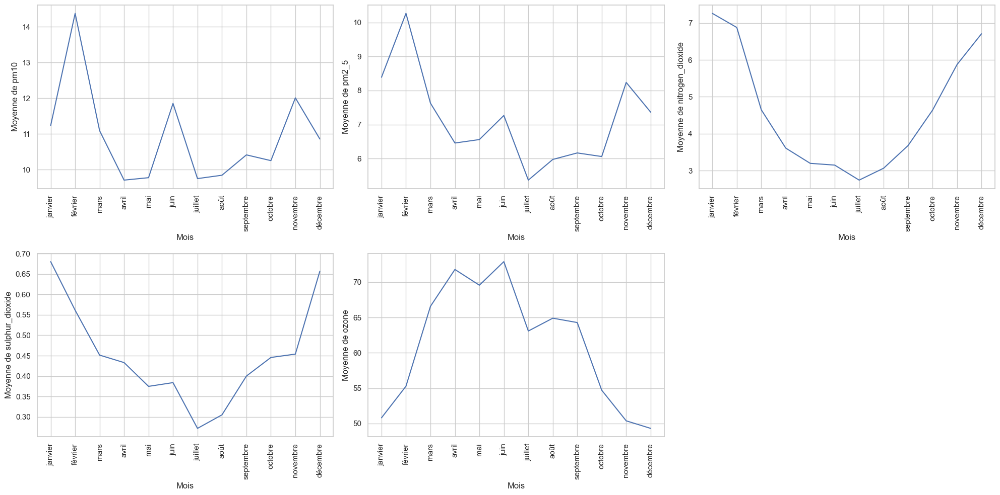

In [45]:
import seaborn as sns
variables_air_month=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone","month"]
df_air_month=df1[variables_air_month].groupby("month").mean()

# Initialiser une figure pour afficher les graphiques
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))

# Afficher un graphique pour chaque variable
for i, column in enumerate(df_air_month):
    ax = axes[i//3, i%3]
    sns.lineplot(x=df_air_month.index, y=df_air_month[column], ax=ax)
    #axes[i].set_title(f'Moyenne de {column} par mois')
    ax.set_xlabel('Mois')
    ax.set_ylabel(f'Moyenne de {column}')
    ax.tick_params(axis='x', rotation=90)
    ax.set_xticks(df_air_month.index)  # Définit les ticks de l'axe des X aux valeurs des mois
    ax.set_xticklabels([month_dict[m] for m in df_air_month.index])


# Masquer le dernier cadre inutilisé
axes[-1, -1].set_visible(False)
    
# Ajuster l'espacement entre les graphiques
plt.tight_layout()
plt.show()

In [46]:
variables_air_region=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone","region","longitude","latitude"]
df_air_region=df_final[variables_air_region].groupby(["region"]).mean()


In [47]:
df_air_region

,pm10,pm2_5,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,longitude,latitude,latitude
region,,,,,,,,,
Auvergne-Rhône-Alpes,11.391398,8.019738,6.163274,0.549964,61.291965,4.536119,4.536119,45.514642,45.514642
Bourgogne-Franche-Comté,9.689458,6.438536,3.534101,0.337881,65.474525,4.806857,4.806857,47.234282,47.234282
Bretagne,11.905880,7.311768,3.597988,0.318262,60.775654,-2.841463,-2.841463,48.177549,48.177549
Centre-Val de Loire,9.917185,6.694089,3.169827,0.282143,60.993690,1.684391,1.684391,47.484775,47.484775
Corse,9.848196,5.443572,1.727952,0.332905,72.720779,9.106152,9.106152,42.151511,42.151511
Grand Est,10.403630,7.027137,4.012548,0.412583,61.399883,5.613112,5.613112,48.688977,48.688977
Hauts-de-France,12.268559,8.227059,6.272761,0.555869,55.656250,2.771303,2.771303,49.969594,49.969594
Normandie,11.407137,7.601459,4.785083,0.499726,60.985420,0.110932,0.110932,49.120067,49.120067
Nouvelle-Aquitaine,10.411905,6.652667,3.004595,0.309143,59.442322,0.212719,0.212719,45.206040,45.206040


In [48]:
df_air_region["LIBELLE_REGION"] = df_air_region.index
gd=france.merge(df_air_region, on="LIBELLE_REGION",how="inner")

In [49]:
gd=gd.to_crs(3857)

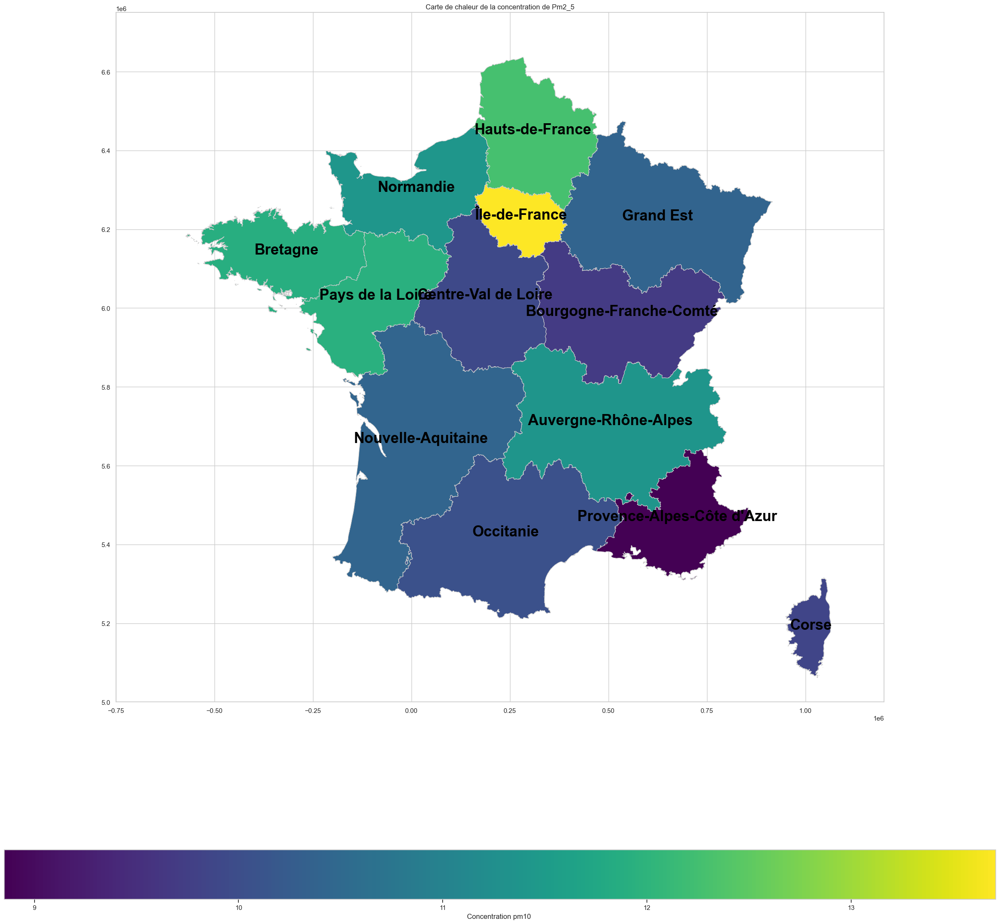

In [50]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(1, 1, figsize=(30, 30))

# Définir la palette de couleurs et la normalisation pour la variable
norm = mpl.colors.Normalize(vmin=gd['pm10'].min(), vmax=gd['pm10'].max())
cmap = plt.cm.viridis  # Choisissez votre palette de couleurs (par ex. viridis, plasma, etc.)

# Afficher la carte avec la coloration proportionnelle à la concentration de NO2

gd.plot(column='pm10', cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, norm=norm, legend_kwds={'label': "Concentration pm10 ", 'orientation': "horizontal"})
# Ajuster les limites de l'axe pour que le cadre soit centré sur les géométries
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
#ax.set_xlim(bounds[0], bounds[2])  # minx, maxx
#ax.set_ylim(bounds[1], bounds[3])  # miny, maxy
# Ajouter un titre
ax.set_title("Carte de chaleur de la concentration de Pm2_5")

for idx, row in gd.iterrows():
    #Récupérer le centroïde de chaque région pour le positionner correctement
    centroid = row['geometry'].centroid
    #Ajouter le nom de la région au centroïde de la géométrie
    ax.text(centroid.x, centroid.y, row['LIBELLE_REGION'], fontsize=25, ha='center', color='black', weight='bold')

# Afficher la carte
plt.show()

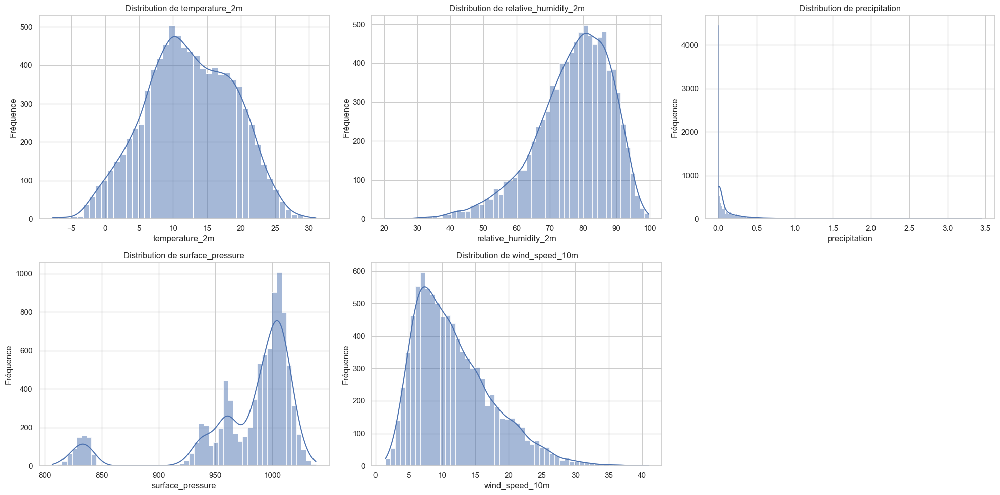

In [51]:
import math
#Liste des variables d'intérêt
var_climat = ["temperature_2m", "relative_humidity_2m", "precipitation", "surface_pressure", "wind_speed_10m"]

# Calcul du nombre de lignes et colonnes nécessaires
n_vars = len(var_climat)
n_cols = 3  # Nombre de colonnes souhaité
n_rows = math.ceil(n_vars / n_cols)  # Calculer dynamiquement le nombre de lignes

# Initialiser une figure
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 5 * n_rows))

# Aplatir les axes pour itérer facilement (si n_rows > 1)
axes = axes.flatten()

# Boucle pour créer un histogramme pour chaque variable
for i, variable in enumerate(var_climat):
    sns.histplot(data=df_final, x=variable, kde=True, ax=axes[i])
    axes[i].set_title(f"Distribution de {variable}")
    axes[i].set_xlabel(variable)
    axes[i].set_ylabel("Fréquence")

# Masquer les axes inutilisés (s'il y en a)
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# Ajuster l'espacement entre les graphiques
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Matrice de Corrélation')

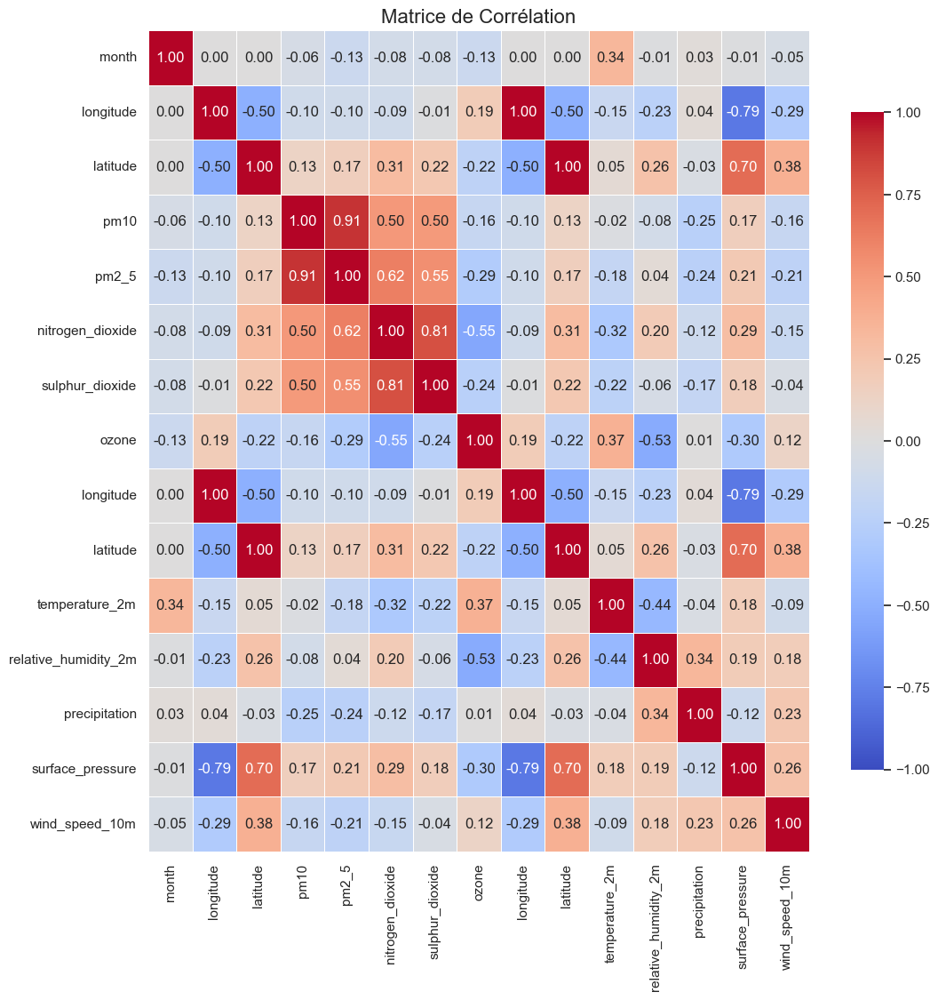

In [52]:
import numpy as np
corr_matrix = df_final.select_dtypes(include=[np.number]).corr()
plt.figure(figsize=(12, 12))  # Taille de la figure
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, 
            linewidths=0.5, fmt='.2f', cbar_kws={'shrink': 0.8})

# Titre
plt.title('Matrice de Corrélation', fontsize=16)

La matrice de corrélation permet d'identifier les relations linéaires entre différentes variables. 
Notamment il existe une bonne corrélation positive entre la précipitation et la concentration des gazs polluants puisqu'elle permet de  nettoyer l'air en lavant les polluants atmosphériques. Les gouttes de pluie capturent les particules et les gaz polluants, les déposant au sol.
On observe notamment une corrélation négative entre la température et les différents polluant, puisque le froid permet de limiter la dispersion verticale des polluants et entraîne une accumulation de polluants près du sol.
De plus plusieurs gazs sont fortement corrélés: NO2/SO2 et pm2.5/pm10 qui proviennent généralement des mêmes sources et des mêmes réactions chimiques.

## Prédiction par le modèle ARIMA


In [53]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [35]:
df_idf = df_final[df_final["region"]=="Île-de-France"]
df_idf

,day,month,region,longitude,latitude,pm10,pm2_5,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
date,,,,,,,,,,,,,,,,,
2023-01-01 11:30:00+00:00,2023-01-01,1,Île-de-France,2.503401,48.709316,15.383334,9.358334,7.616667,1.375000,46.500000,2.503401,48.709316,13.652084,71.534920,0.079167,1009.788025,19.753124
2023-01-02 11:30:00+00:00,2023-01-02,1,Île-de-France,2.503401,48.709316,9.312500,6.445833,16.291666,1.337500,49.625000,2.503401,48.709316,10.062500,89.010780,0.404167,1015.033752,13.947431
2023-01-03 11:30:00+00:00,2023-01-03,1,Île-de-France,2.503401,48.709316,11.849999,7.379167,13.200000,1.141667,45.166668,2.503401,48.709316,7.752083,91.482140,0.062500,1022.744385,16.570414
2023-01-04 11:30:00+00:00,2023-01-04,1,Île-de-France,2.503401,48.709316,5.800000,3.862500,7.841667,1.187500,57.375000,2.503401,48.709316,11.695834,89.660561,0.112500,1019.289001,25.613174
2023-01-05 11:30:00+00:00,2023-01-05,1,Île-de-France,2.503401,48.709316,6.237500,4.679166,14.345833,1.300000,51.375000,2.503401,48.709316,12.356251,88.560097,0.020833,1019.476074,15.305164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-26 11:30:00+00:00,2024-11-26,11,Île-de-France,2.503401,48.709316,12.691667,8.512500,13.220833,0.916667,48.250000,2.503401,48.709316,8.658334,88.946800,0.108333,1014.152649,11.292778
2024-11-27 11:30:00+00:00,2024-11-27,11,Île-de-France,2.503401,48.709316,7.362500,5.725000,11.762500,0.775000,51.750000,2.503401,48.709316,10.439584,91.109230,0.254167,1012.352295,17.599253
2024-11-28 11:30:00+00:00,2024-11-28,11,Île-de-France,2.503401,48.709316,14.870833,12.295834,19.445833,1.537500,35.708332,2.503401,48.709316,6.358334,84.380318,0.004167,1022.028015,6.830119


In [55]:
###  juste pour tester les fonctions suivantes car "base finale" dérange plus haut
#df=df.drop(columns="carbon_dioxide")
#df_idf = df1[df1["region"]=="Île-de-France"]
#df_idf

In [56]:
pip install statsmodels

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [57]:
df_idf.shape

(700, 18)

In [58]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(df_idf["pm10"])
print(f"ADF Statistic: {result[0]}")
print(f"P-Value: {result[1]}")

ADF Statistic: -4.543861303729894
P-Value: 0.00016370672299803759


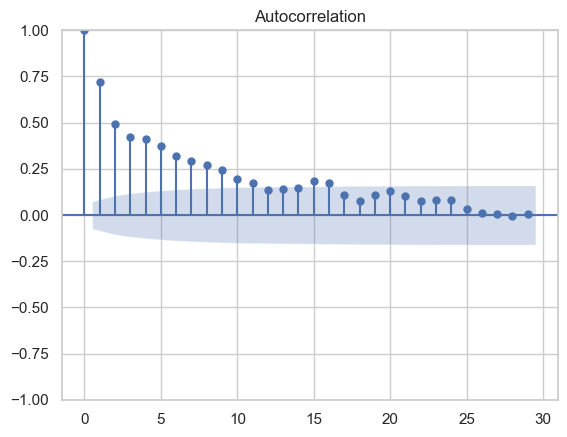

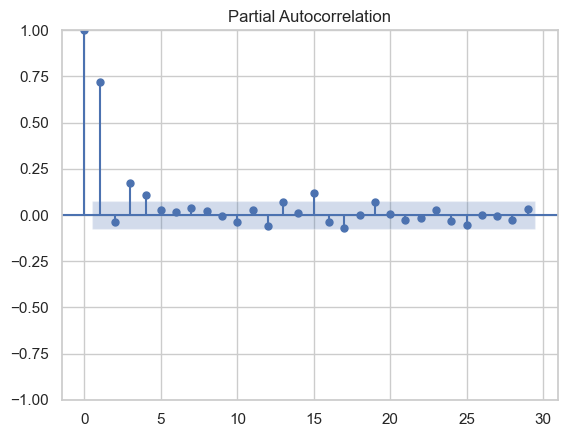

In [59]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(df_idf["pm10"])
plot_pacf(df_idf["pm10"])
plt.show()

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


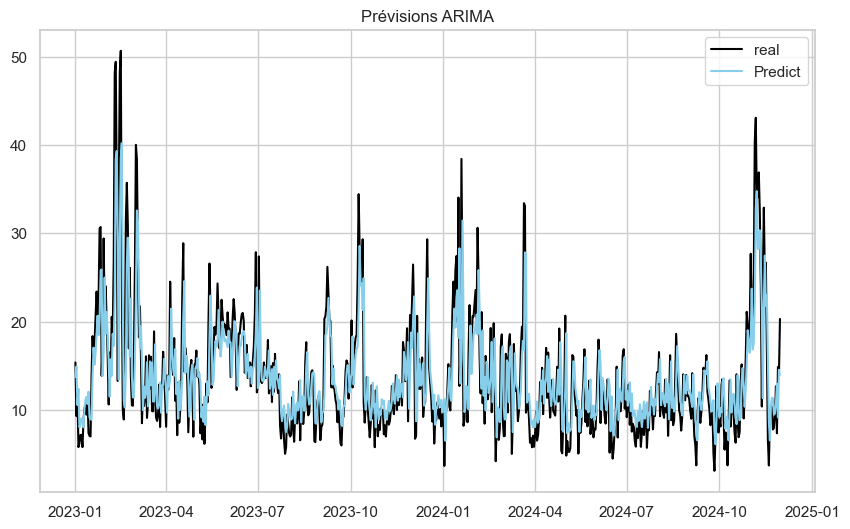

In [60]:
# ARIMA LİBRARY
from statsmodels.tsa.arima.model import ARIMA
#from pandas import datetime

# fit model
model = ARIMA(df_idf["pm10"], order=(1,0,0)) 
model_fit = model.fit()

#prediction
plt.figure(figsize=(10, 6))
plt.plot(df_idf["day"],df_idf["pm10"], label="real",color="black")
plt.plot(df_idf["day"],model_fit.predict(), label="Predict", color='skyblue')
plt.title("Prévisions ARIMA")
plt.legend()
plt.show()


c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


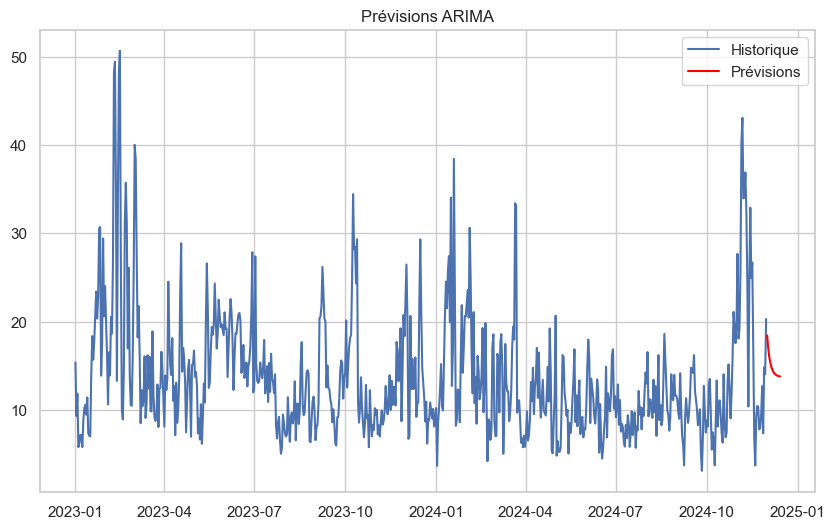

In [61]:
#forecast
forecast_steps = 14 #2semaines
forecast = model_fit.forecast(steps=forecast_steps)
# Visualisation des prévisions
plt.figure(figsize=(10, 6))
plt.plot(df_idf["day"],df_idf["pm10"], label="Historique")
plt.plot(pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:], 
         forecast, label="Prévisions", color='red')
plt.title("Prévisions ARIMA")
plt.legend()
plt.show()

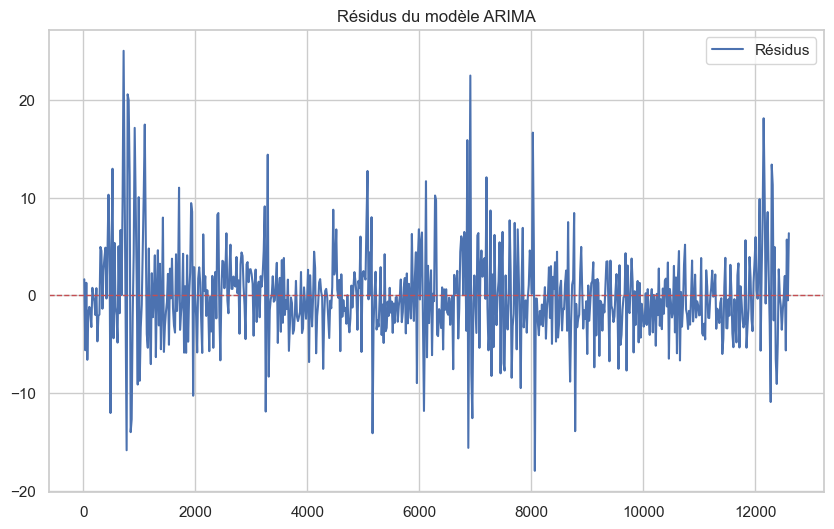

In [62]:
# Visualisation des résidus
residuals = model_fit.resid
plt.figure(figsize=(10, 6))
plt.plot(residuals, label="Résidus")
plt.axhline(y=0, color='r', linestyle='--', linewidth=1)
plt.title("Résidus du modèle ARIMA")
plt.legend()
plt.show()

In [63]:
import importlib
from scripts import modele  # Supposez que votre module est `scripts.api`

# Rechargez le module
importlib.reload(modele)

<module 'scripts.modele' from 'c:\\Users\\steph\\Documents\\ENSAE\\Python pour la data science\\Projet_Python_2024-1\\scripts\\modele.py'>

### ARIMA pm10

La série est stationnaire.


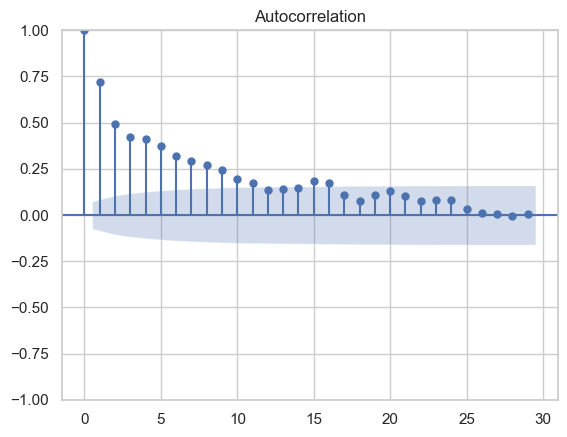

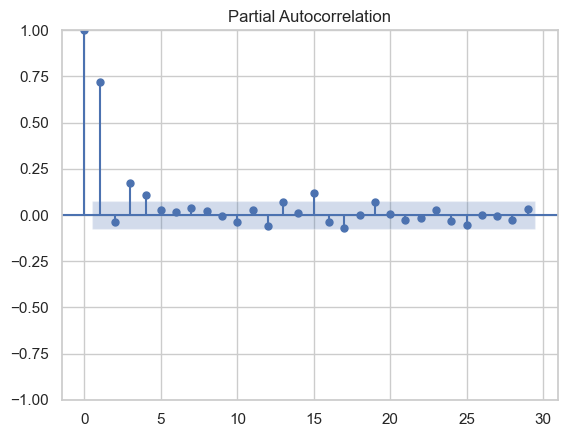

In [64]:

from scripts import modele
modele.stationarity_acf(df_idf,"pm10")



c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


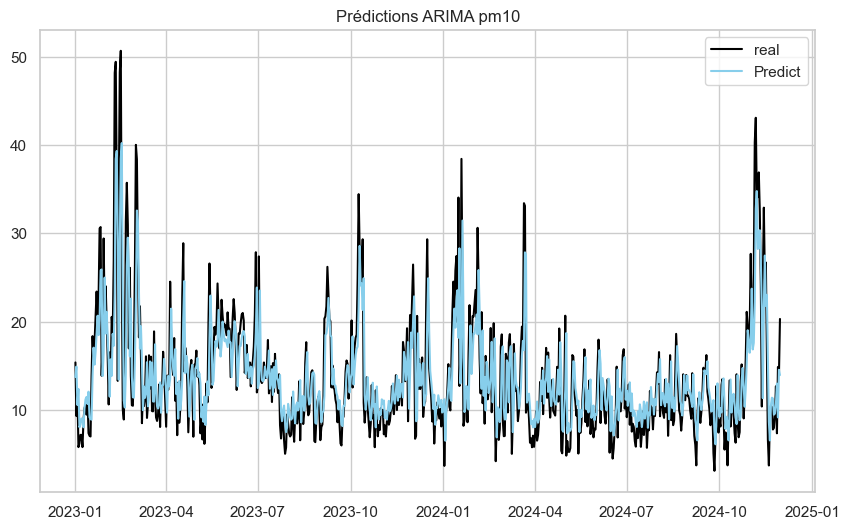

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


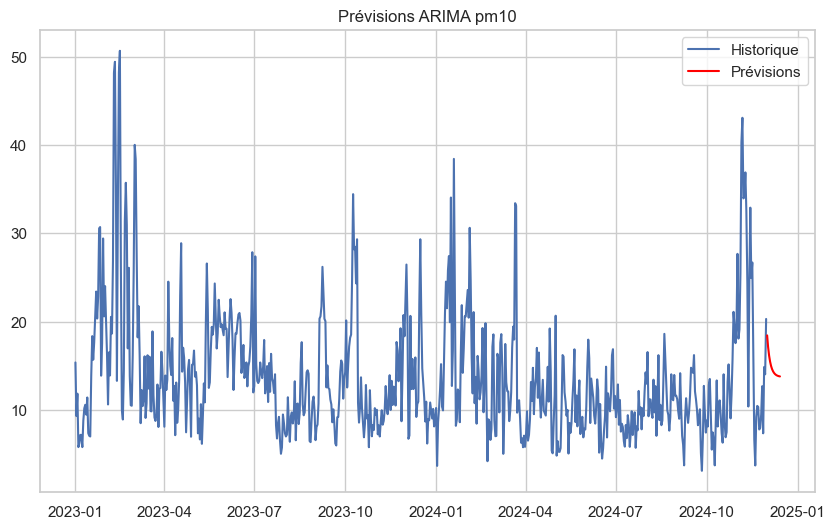

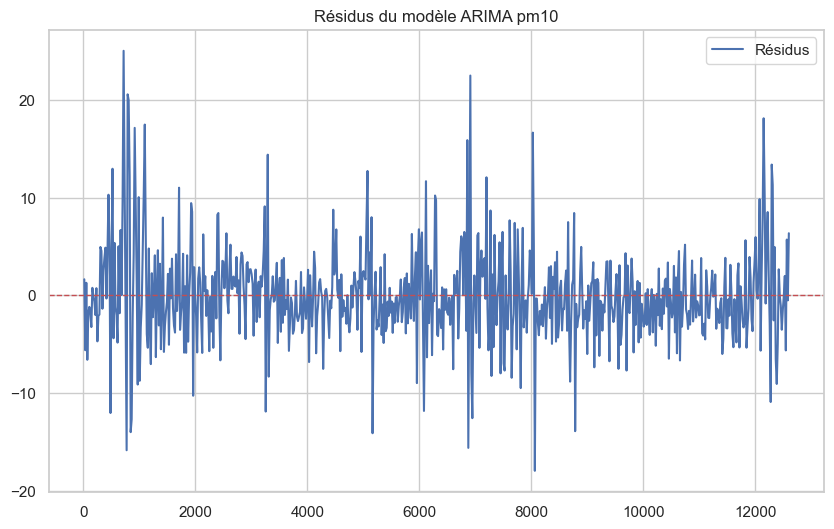

In [181]:
model_fit_pm10 = modele.fit_arima(df_idf,"pm10",1,0,0)
modele.prediction_arima(df_idf,"pm10",model_fit_pm10)
forecast_pm10 = modele.prevision_arima(df_idf,"pm10",model_fit_pm10)
modele.residus(df_idf,"pm10",model_fit_pm10)

### ARIMA pm2_5

La série est stationnaire.


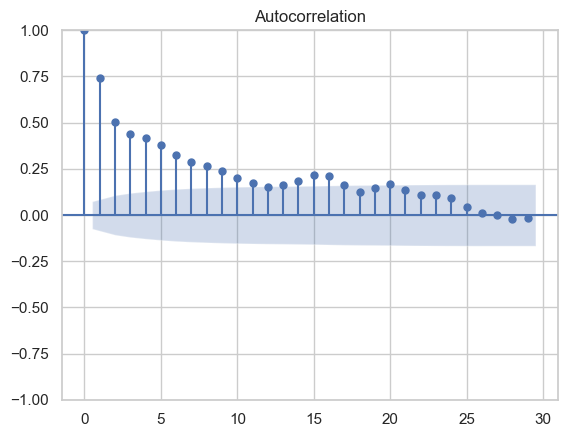

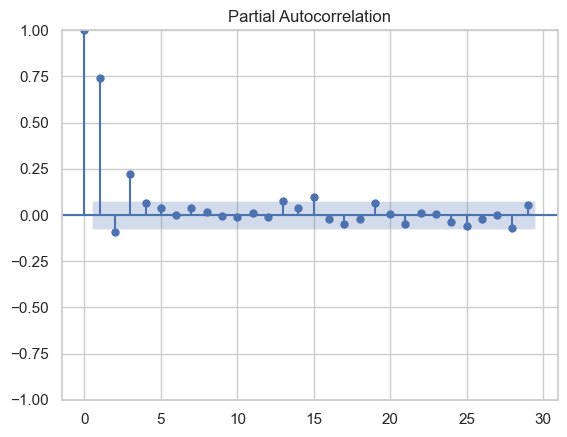

In [179]:

from scripts import modele
modele.stationarity_acf(df_idf,"pm2_5")



c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


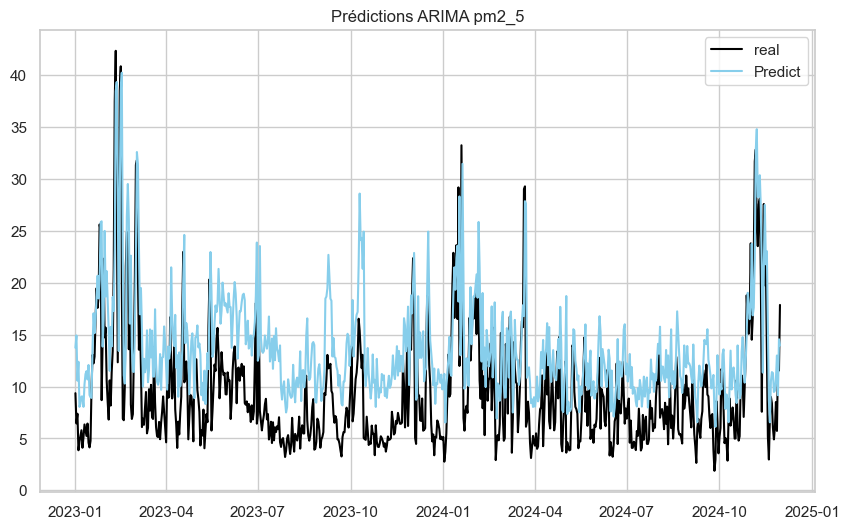

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


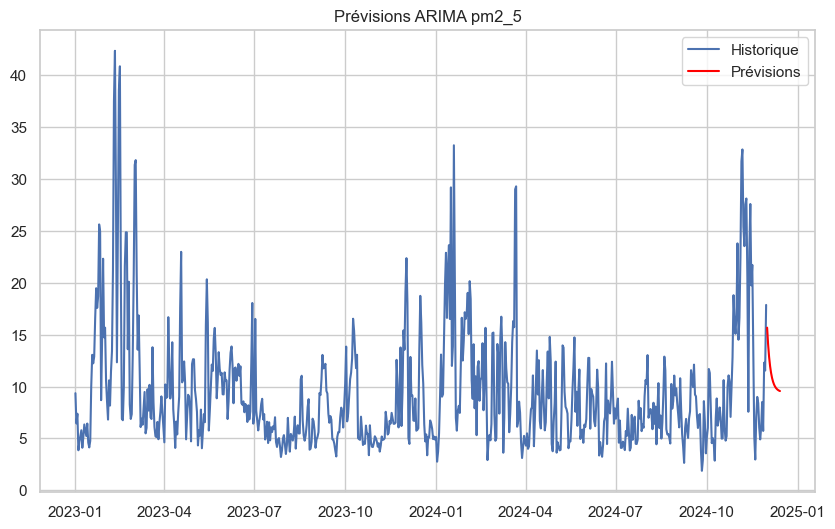

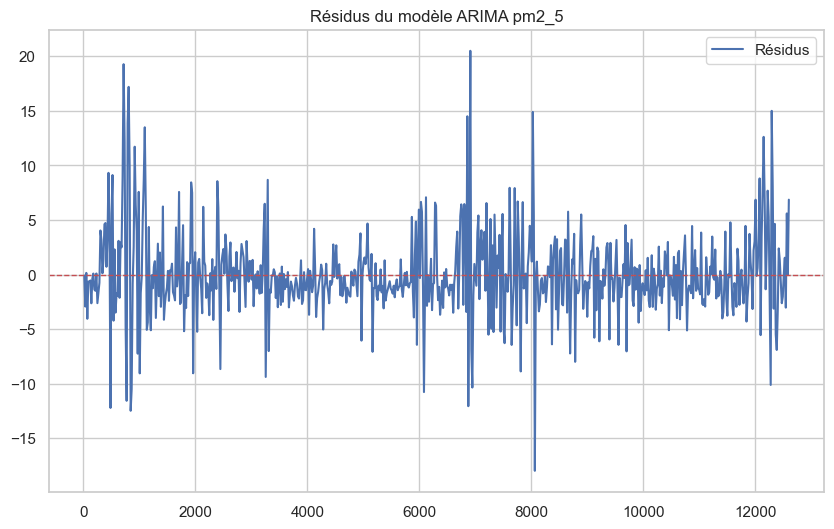

In [182]:
model_fit_pm2_5 = modele.fit_arima(df_idf,"pm2_5",1,0,0)
modele.prediction_arima(df_idf,"pm2_5",model_fit_pm10)
forecast_pm2_5 = modele.prevision_arima(df_idf,"pm2_5",model_fit_pm2_5)
modele.residus(df_idf,"pm2_5",model_fit_pm2_5)

### ARIMA ozone

La série est stationnaire.


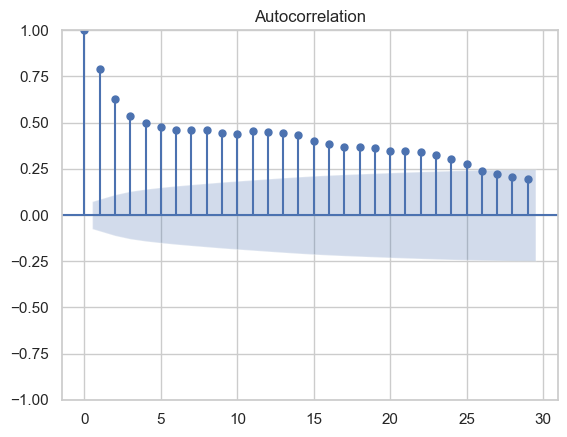

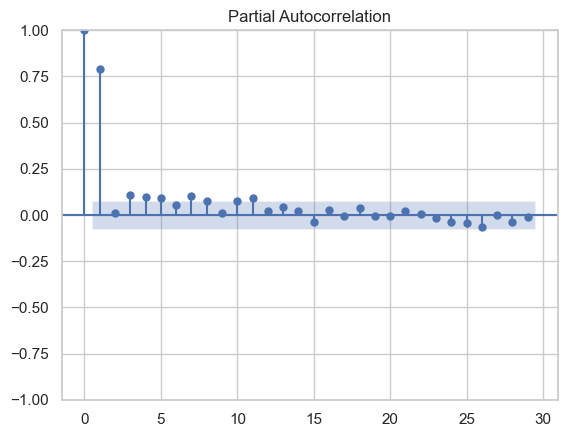

In [187]:

from scripts import modele
modele.stationarity_acf(df_idf,"ozone")



c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


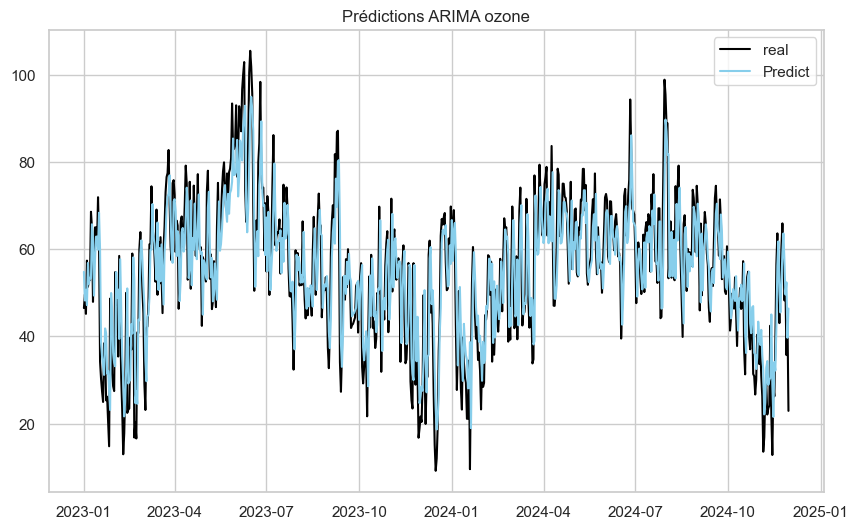

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


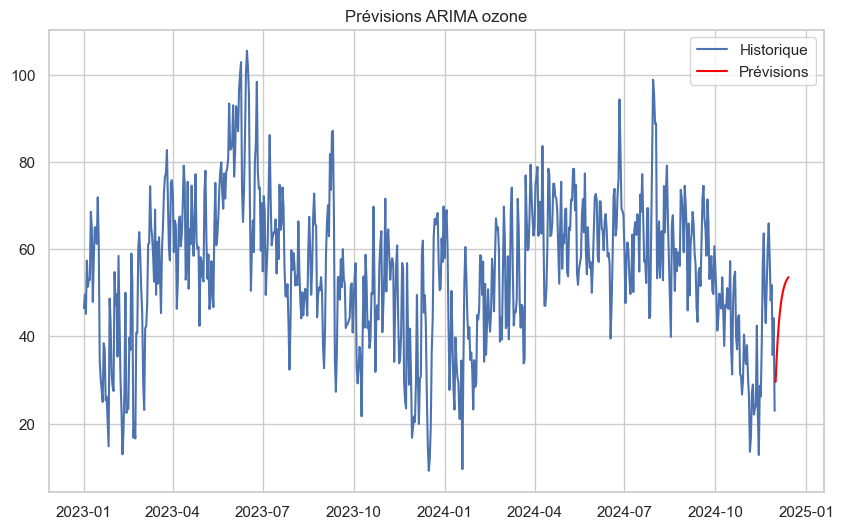

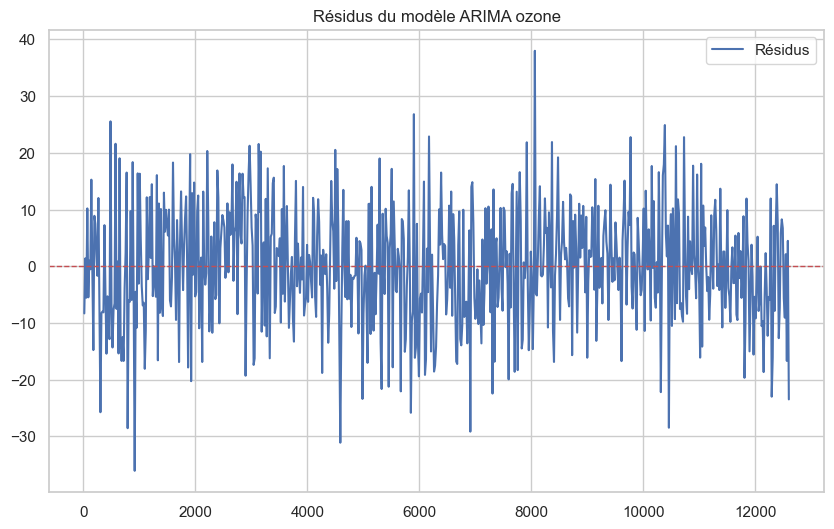

In [188]:
model_fit_ozone = modele.fit_arima(df_idf,"ozone",1,0,0)
modele.prediction_arima(df_idf,"ozone",model_fit_ozone)
forecast_ozone = modele.prevision_arima(df_idf,"ozone",model_fit_ozone)
modele.residus(df_idf,"ozone",model_fit_ozone)

### ARIMA nitrogen_dioxide

La série est stationnaire.


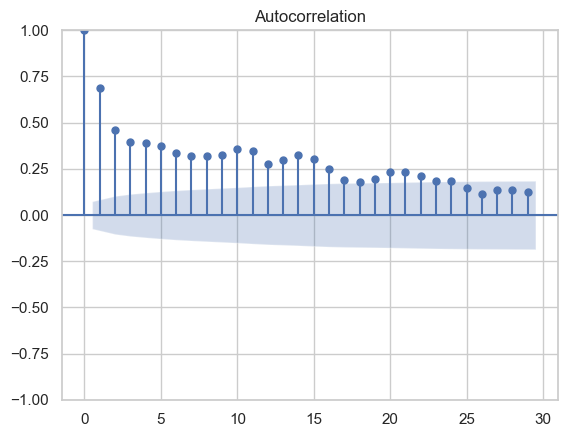

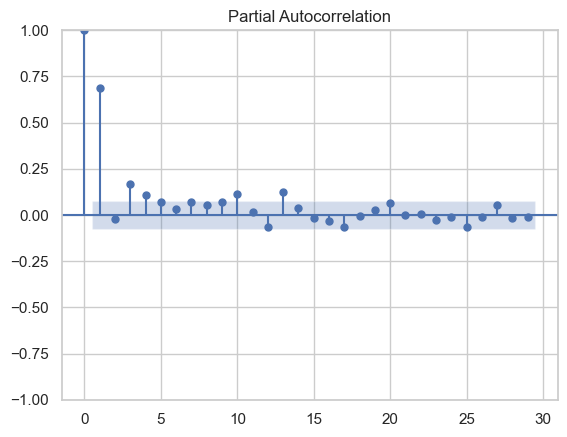

In [189]:

from scripts import modele
modele.stationarity_acf(df_idf,"nitrogen_dioxide")



c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


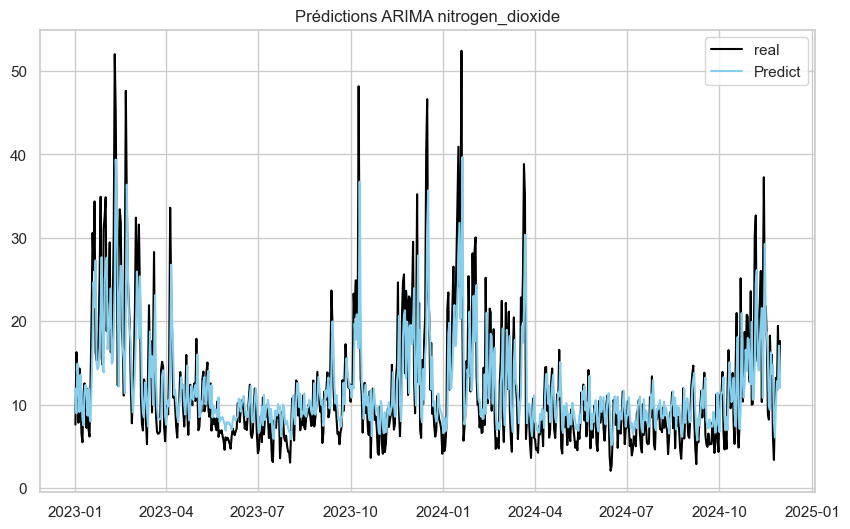

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


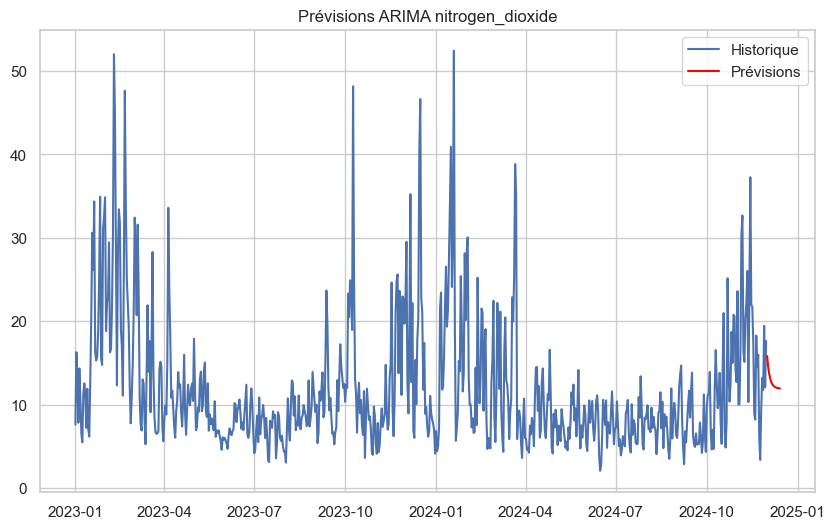

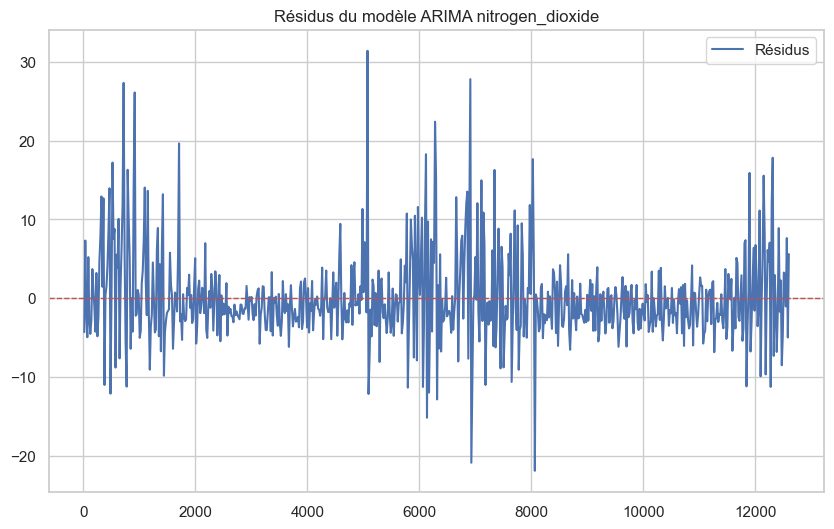

In [190]:
model_fit_nitrogen_dioxide = modele.fit_arima(df_idf,"nitrogen_dioxide",1,0,0)
modele.prediction_arima(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)
forecast_nitrogen_dioxide = modele.prevision_arima(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)
modele.residus(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)

### ARIMA sulphur_dioxide

La série est stationnaire.


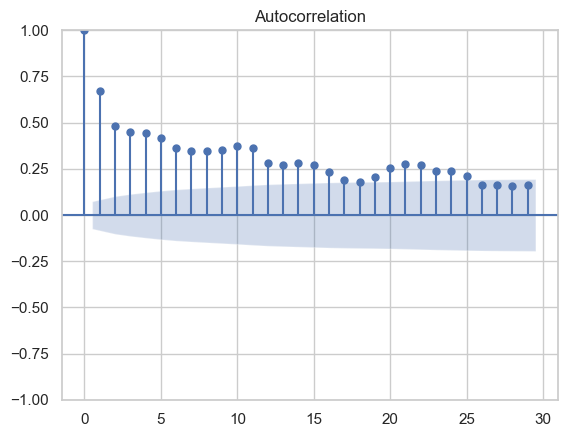

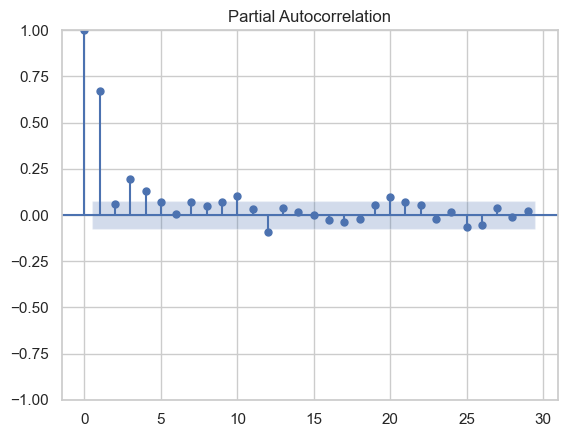

In [191]:

from scripts import modele
modele.stationarity_acf(df_idf,"sulphur_dioxide")



c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


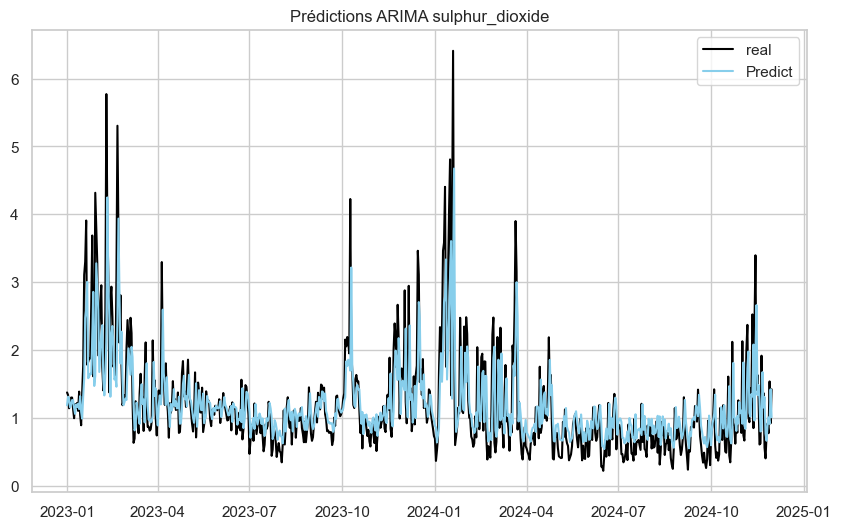

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


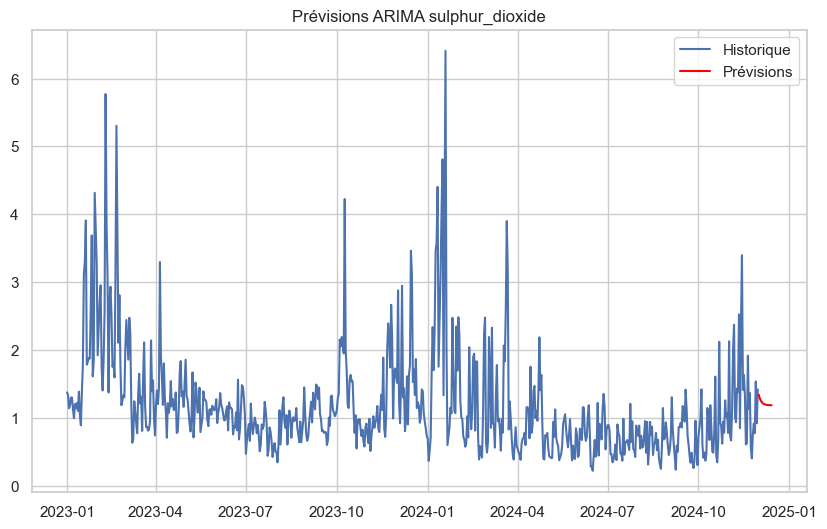

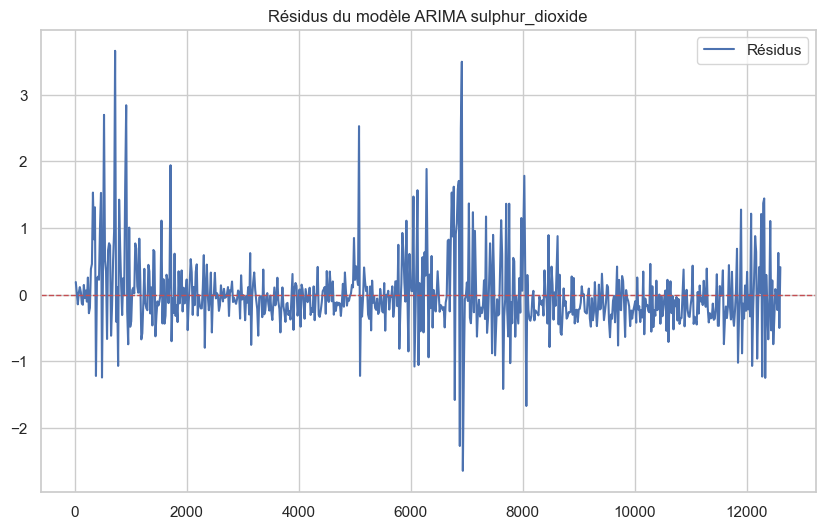

In [192]:
model_fit_sulphur_dioxide = modele.fit_arima(df_idf,"sulphur_dioxide",1,0,0)
modele.prediction_arima(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)
forecast_sulphur_dioxide = modele.prevision_arima(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)
modele.residus(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)

In [203]:
forecast_arima = pd.DataFrame({"pm10" : list(forecast_pm10),
                               "pm2_5" : list(forecast_pm2_5),
                               "ozone" : list(forecast_ozone),
                               "nitrogen_dioxide" : list(forecast_nitrogen_dioxide),
                               "sulphur_dioxide" : list(forecast_sulphur_dioxide)},index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:])

forecast_arima

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
2024-12-01,18.450265,15.669705,29.545616,15.837204,1.342927
2024-12-02,17.117725,14.050125,34.796466,14.603978,1.290895
2024-12-03,16.162074,12.851639,38.955709,13.759201,1.256146
2024-12-04,15.476715,11.964761,42.250282,13.180518,1.232937
2024-12-05,14.985200,11.308474,44.859941,12.784112,1.217437
2024-12-06,14.632703,10.822822,46.927076,12.512569,1.207086
2024-12-07,14.379905,10.463441,48.564471,12.326559,1.200172
2024-12-08,14.198607,10.197500,49.861465,12.199139,1.195554
2024-12-09,14.068586,10.000704,50.888826,12.111855,1.192471
2024-12-10,13.975340,9.855075,51.702608,12.052064,1.190411


In [193]:
from sklearn.preprocessing import StandardScaler


### var simple

In [138]:
scaler1 = StandardScaler()
#df_idf.set_index("day",inplace=True)
df_idf_var1 =  df_idf[['day','pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide']].set_index("day")
df_idf_var1 = pd.DataFrame(scaler1.fit_transform(df_idf_var1), columns=df_idf_var1.columns, index=df_idf_var1.index)
#train_size = int(len(df_idf_var) * 0.95) #entrainement 90%
#train, test = df_idf_var[:train_size], df_idf_var[train_size:]
train1 = df_idf_var1

In [139]:
df_idf_var1

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
day,,,,,
2023-01-01,0.240121,-0.008347,-0.505990,-0.556502,0.247064
2023-01-02,-0.630537,-0.514383,-0.320457,0.564945,0.198297
2023-01-03,-0.266617,-0.352220,-0.585151,0.165275,-0.056377
2023-01-04,-1.134287,-0.963228,0.139666,-0.527416,0.003228
2023-01-05,-1.071543,-0.821335,-0.216558,0.313400,0.149530
...,...,...,...,...,...
2024-11-26,-0.145908,-0.155307,-0.402091,0.167968,-0.348980
2024-11-27,-0.910199,-0.639625,-0.194294,-0.020556,-0.533212
2024-11-28,0.166620,0.502033,-1.146699,0.972695,0.458389


In [140]:
#selection ordre du modèle
from statsmodels.tsa.api import VAR

# Initialiser le modèle
model1 = VAR(train1)

# Sélection de l'ordre optimal
selected_order1 = model1.select_order(maxlags=15)  # Ajustez maxlags en fonction des données
print(selected_order1.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -5.534      -5.500    0.003952      -5.521
1       -8.659     -8.460*   0.0001736      -8.582
2       -8.725      -8.362   0.0001624     -8.584*
3      -8.766*      -8.237  0.0001559*      -8.561
4       -8.752      -8.058   0.0001581      -8.484
5       -8.742      -7.882   0.0001598      -8.409
6       -8.703      -7.678   0.0001661      -8.307
7       -8.667      -7.477   0.0001723      -8.206
8       -8.637      -7.282   0.0001775      -8.113
9       -8.605      -7.085   0.0001833      -8.017
10      -8.594      -6.908   0.0001854      -7.942
11      -8.572      -6.721   0.0001897      -7.856
12      -8.548      -6.531   0.0001945      -7.767
13      -8.541      -6.359   0.0001960      -7.696
14      -8.513      -6.165   0.0002017      -7.604
15      -8.506      -5.993   0.0002032      -7.534
-------------------------------

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [141]:
optimal_lag1 = selected_order1.aic
optimal_lag1

np.int64(3)

In [142]:
# Fitting the VAR model with the optimal lag
#optimal_lag=1
var_model1 = model1.fit(optimal_lag1)

# Summary of the VAR model
var_model1_summary = var_model1.summary()
var_model1_summary

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 23, Dec, 2024
Time:                     17:09:07
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -8.29156
Nobs:                     697.000    HQIC:                  -8.61165
Log likelihood:          -1793.52    FPE:                0.000148729
AIC:                     -8.81343    Det(Omega_mle):     0.000132774
--------------------------------------------------------------------
Results for equation pm10
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                       0.002019         0.025512            0.079           0.937
L1.pm10                     0.414465         0.122447            3.385           0.001
L1.pm2_5                    0.227852 

In [143]:
print(train1.values.shape)  # Nombre de lignes et colonnes
print(var_model1.coefs.shape)  # Dimensions des coefficients

(700, 5)
(3, 5, 5)


In [144]:
# Faire des prédictions
forecast_steps = 14
forecast1 = var_model1.forecast(y=train1.values, steps=forecast_steps)

# Convertir les prévisions en DataFrame
forecast_df1 = pd.DataFrame(forecast1, index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:], columns=df_idf_var1.columns)
forecast_df1



,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
2024-12-01,0.762227,1.231797,-1.546846,0.716565,0.349286
2024-12-02,0.369313,0.756047,-1.127244,0.498913,0.124195
2024-12-03,0.373218,0.692395,-0.975044,0.563493,0.260867
2024-12-04,0.435302,0.717293,-0.883730,0.602774,0.335297
2024-12-05,0.390554,0.640149,-0.752490,0.521741,0.276771
2024-12-06,0.322682,0.539578,-0.627727,0.439125,0.237472
2024-12-07,0.286941,0.476153,-0.536817,0.393309,0.228180
2024-12-08,0.263817,0.429856,-0.462537,0.352773,0.211967
2024-12-09,0.235643,0.381065,-0.395114,0.307704,0.187790
2024-12-10,0.207220,0.334320,-0.336908,0.267116,0.166103


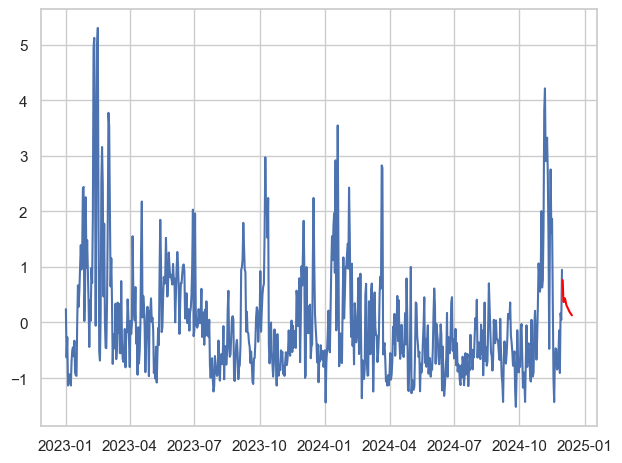

In [145]:
# Visualiser les prévisions
plt.Figure((10,5))
plt.plot(df_idf_var1.index,df_idf_var1["pm10"], label="Historique")
plt.plot(pd.date_range(max(df_idf_var1.index), periods=forecast_steps+1, freq='D')[1:],
         forecast_df1["pm10"],label="prevision VAR pm10",color="red")
plt.tight_layout()
plt.show()

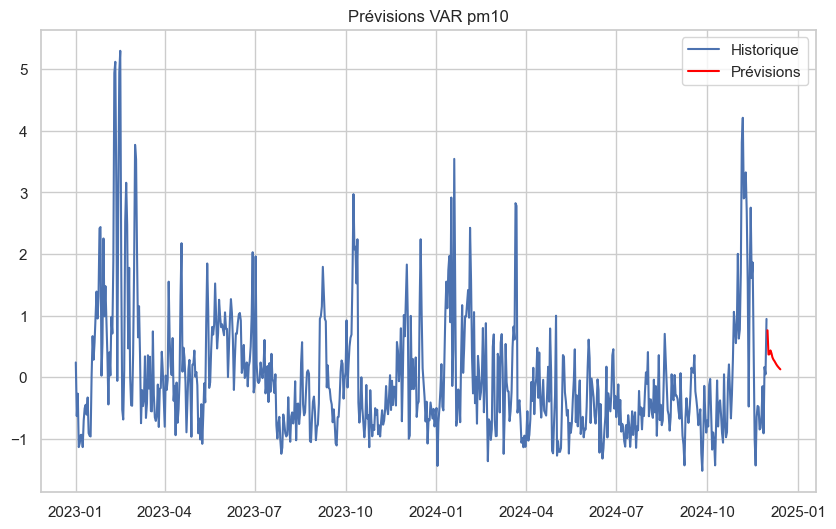

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
2024-12-01,0.762227,1.231797,-1.546846,0.716565,0.349286
2024-12-02,0.369313,0.756047,-1.127244,0.498913,0.124195
2024-12-03,0.373218,0.692395,-0.975044,0.563493,0.260867
2024-12-04,0.435302,0.717293,-0.883730,0.602774,0.335297
2024-12-05,0.390554,0.640149,-0.752490,0.521741,0.276771
2024-12-06,0.322682,0.539578,-0.627727,0.439125,0.237472
2024-12-07,0.286941,0.476153,-0.536817,0.393309,0.228180
2024-12-08,0.263817,0.429856,-0.462537,0.352773,0.211967
2024-12-09,0.235643,0.381065,-0.395114,0.307704,0.187790
2024-12-10,0.207220,0.334320,-0.336908,0.267116,0.166103


In [146]:
modele.prevision_var(df_idf_var1,"pm10",var_model1)

In [147]:
resid1 = var_model1.resid
print(resid1.describe())

               pm10         pm2_5         ozone  nitrogen_dioxide  \
count  6.970000e+02  6.970000e+02  6.970000e+02      6.970000e+02   
mean  -2.548575e-18  9.047442e-17  7.390868e-17     -1.350745e-16   
std    6.661985e-01  6.385024e-01  5.998755e-01      7.025803e-01   
min   -3.004281e+00 -2.847974e+00 -2.012661e+00     -2.918509e+00   
25%   -3.911011e-01 -3.157531e-01 -3.988699e-01     -3.845697e-01   
50%   -4.838419e-02 -7.168720e-02 -1.269459e-02     -9.169955e-02   
75%    3.408013e-01  3.020245e-01  4.179363e-01      2.881362e-01   
max    3.453000e+00  3.262311e+00  2.049704e+00      4.222452e+00   

       sulphur_dioxide  
count     6.970000e+02  
mean     -1.274288e-16  
std       7.159777e-01  
min      -3.231495e+00  
25%      -3.601787e-01  
50%      -7.897059e-02  
75%       2.271854e-01  
max       4.796975e+00  


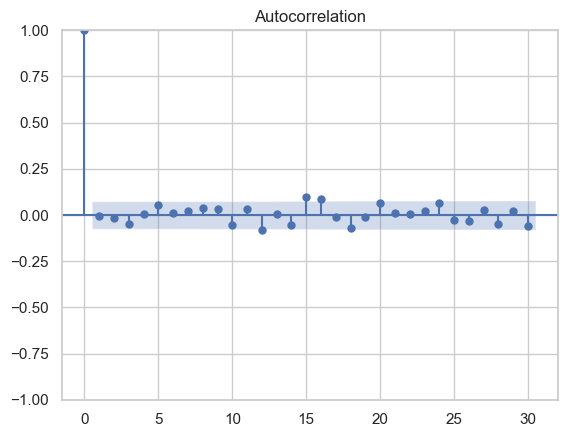

In [148]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(resid1["pm10"], lags=30)
plt.show()

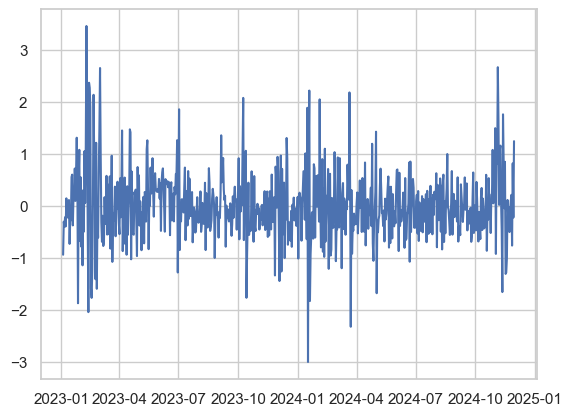

In [149]:
plt.plot(resid1["pm10"])

### var avec variables climatiques

In [150]:
scaler2 = StandardScaler()
#df_idf.set_index("day",inplace=True)
df_idf_var2 =  df_idf[['day','pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide',"temperature_2m", "relative_humidity_2m", "precipitation", "surface_pressure", "wind_speed_10m"]].set_index("day")
df_idf_var2 = pd.DataFrame(scaler2.fit_transform(df_idf_var2), columns=df_idf_var2.columns, index=df_idf_var2.index)
#train_size = int(len(df_idf_var) * 0.95) #entrainement 90%
#train, test = df_idf_var[:train_size], df_idf_var[train_size:]
train2 = df_idf_var2

In [151]:
df_idf_var2

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
day,,,,,,,,,,
2023-01-01,0.240121,-0.008347,-0.505990,-0.556502,0.247064,0.096452,-0.674185,-0.176358,-0.053938,1.133370
2023-01-02,-0.630537,-0.514383,-0.320457,0.564945,0.198297,-0.486798,1.110819,1.402707,0.491810,0.116135
2023-01-03,-0.266617,-0.352220,-0.585151,0.165275,-0.056377,-0.862204,1.363247,-0.257336,1.293998,0.575717
2023-01-04,-1.134287,-0.963228,0.139666,-0.527416,0.003228,-0.221408,1.177189,-0.014402,0.934511,2.160129
2023-01-05,-1.071543,-0.821335,-0.216558,0.313400,0.149530,-0.114100,1.064786,-0.459780,0.953974,0.354028
...,...,...,...,...,...,...,...,...,...,...
2024-11-26,-0.145908,-0.155307,-0.402091,0.167968,-0.348980,-0.714953,1.104284,-0.034647,0.400143,-0.348995
2024-11-27,-0.910199,-0.639625,-0.194294,-0.020556,-0.533212,-0.425528,1.325158,0.673908,0.212840,0.755983
2024-11-28,0.166620,0.502033,-1.146699,0.972695,0.458389,-1.088666,0.637859,-0.540757,1.219469,-1.130912


In [152]:
#selection ordre du modèle
from statsmodels.tsa.api import VAR

# Initialiser le modèle
model2 = VAR(train2)

# Sélection de l'ordre optimal
selected_order2 = model2.select_order(maxlags=15)  # Ajustez maxlags en fonction des données
print(selected_order2.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -8.518      -8.452   0.0001998      -8.492
1       -15.58     -14.85*   1.717e-07      -15.30
2      -15.85*      -14.46  1.313e-07*     -15.31*
3       -15.82      -13.77   1.352e-07      -15.02
4       -15.71      -13.00   1.508e-07      -14.66
5       -15.62      -12.24   1.658e-07      -14.31
6       -15.49      -11.45   1.887e-07      -13.93
7       -15.42      -10.73   2.016e-07      -13.61
8       -15.28      -9.921   2.346e-07      -13.20
9       -15.15      -9.131   2.681e-07      -12.82
10      -15.06      -8.383   2.940e-07      -12.48
11      -14.96      -7.620   3.280e-07      -12.12
12      -14.87      -6.868   3.619e-07      -11.77
13      -14.88      -6.218   3.617e-07      -11.53
14      -14.77      -5.443   4.101e-07      -11.16
15      -14.73      -4.748   4.301e-07      -10.87
-------------------------------

c:\Users\steph\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [153]:
optimal_lag2 = selected_order2.aic
optimal_lag2

np.int64(2)

In [154]:
# Fitting the VAR model with the optimal lag
#optimal_lag=1
var_model2 = model.fit(optimal_lag2)

# Summary of the VAR model
var_model2_summary = var_model2.summary()
var_model2_summary

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 23, Dec, 2024
Time:                     17:09:08
--------------------------------------------------------------------
No. of Equations:         10.0000    BIC:                   -14.5239
Nobs:                     698.000    HQIC:                  -15.3632
Log likelihood:          -4147.80    FPE:                1.25363e-07
AIC:                     -15.8922    Det(Omega_mle):     9.32041e-08
--------------------------------------------------------------------
Results for equation pm10
                             coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------------
const                           0.001852         0.025303            0.073           0.942
L1.pm10                         0.498753         0.130026            3.836           0.000
L1.pm2_5             

In [155]:
# Faire des prédictions
forecast_steps = 14
forecast2 = var_model2.forecast(y=train2.values, steps=forecast_steps)

# Convertir les prévisions en DataFrame
forecast_df2 = pd.DataFrame(forecast2, index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:], columns=df_idf_var2.columns)
forecast_df2



,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
2024-12-01,0.982075,1.519064,-1.626527,0.942944,0.569323,-1.311874,1.141761,-0.397067,0.702782,-0.680805
2024-12-02,0.919714,1.391158,-1.348804,1.026408,0.686002,-1.131672,1.074655,-0.282827,0.529726,-0.316964
2024-12-03,0.725531,1.127881,-1.119418,0.885997,0.585338,-1.075689,1.020344,-0.161438,0.493077,-0.161425
2024-12-04,0.527513,0.869785,-0.934144,0.723685,0.486389,-1.047048,0.936912,-0.128776,0.460235,-0.058431
2024-12-05,0.404447,0.700909,-0.802466,0.626953,0.443865,-1.015926,0.850844,-0.127319,0.407395,0.016061
2024-12-06,0.340484,0.602563,-0.709362,0.573637,0.429811,-0.980985,0.781016,-0.119052,0.341563,0.070849
2024-12-07,0.302042,0.536611,-0.638120,0.534852,0.419788,-0.946291,0.725977,-0.102857,0.274046,0.113330
2024-12-08,0.271186,0.482763,-0.580105,0.499618,0.406909,-0.914005,0.679626,-0.085889,0.213379,0.146628
2024-12-09,0.243245,0.435488,-0.531869,0.466794,0.392133,-0.883927,0.638366,-0.071838,0.163435,0.171997
2024-12-10,0.218414,0.394480,-0.491506,0.437227,0.377279,-0.855055,0.600990,-0.061138,0.124439,0.190505


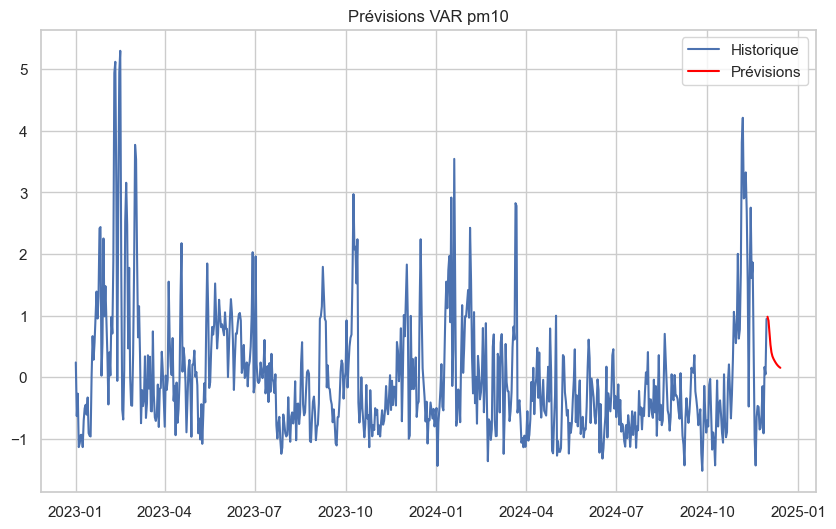

In [171]:
forecast_var_pm10 = modele.prevision_var(df_idf_var2,"pm10",var_model2)

In [172]:
resid2 = var_model2.resid
resid2.describe()

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
count,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02
mean,1.297911e-16,2.570373e-16,-7.380279e-17,7.380279e-17,1.628751e-16,-2.334968e-16,4.326371e-17,-1.297911e-16,7.221221e-17,-1.908693e-16
std,6.587923e-01,6.301610e-01,5.896090e-01,6.947984e-01,7.081852e-01,2.895633e-01,6.218409e-01,9.422526e-01,5.003081e-01,7.729449e-01
min,-2.125641e+00,-2.458355e+00,-1.970284e+00,-2.423753e+00,-2.864269e+00,-1.092135e+00,-2.150971e+00,-1.490610e+00,-2.096602e+00,-2.258905e+00
25%,-3.779055e-01,-3.402965e-01,-3.963164e-01,-3.931130e-01,-3.704017e-01,-1.829316e-01,-4.307992e-01,-4.984111e-01,-2.899028e-01,-5.326270e-01
50%,-3.961027e-02,-6.627654e-02,1.229977e-02,-8.149312e-02,-7.484665e-02,4.490147e-04,-2.164572e-02,-2.405052e-01,3.095736e-02,-5.857267e-02
75%,3.322187e-01,2.767326e-01,4.201867e-01,2.964649e-01,2.564697e-01,1.926641e-01,4.016102e-01,1.112800e-01,2.942932e-01,4.723965e-01
max,2.900687e+00,3.150256e+00,1.976933e+00,4.326169e+00,4.520050e+00,1.209940e+00,2.171690e+00,1.018887e+01,1.795132e+00,2.820452e+00


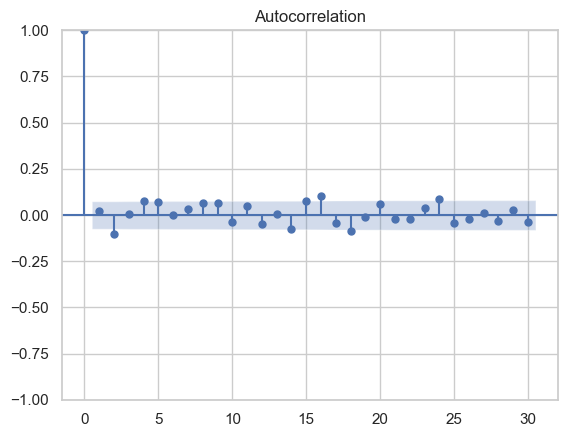

In [159]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(resid2["pm10"], lags=30)
plt.show()

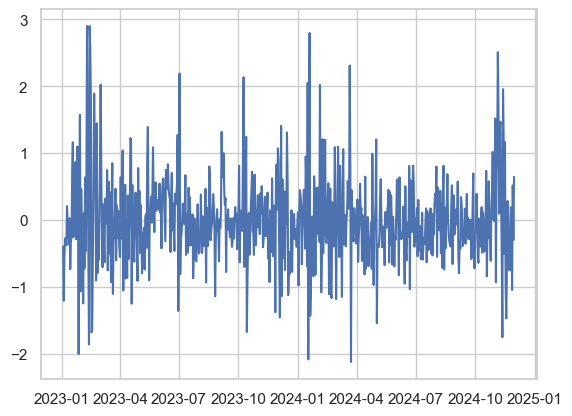

In [160]:
plt.plot(resid2["pm10"])

In [161]:
import importlib
from scripts import modele  # Supposez que votre module est `scripts.api`

# Rechargez le module
importlib.reload(modele)

<module 'scripts.modele' from 'c:\\Users\\steph\\Documents\\ENSAE\\Python pour la data science\\Projet_Python_2024-1\\scripts\\modele.py'>

### Evaluation du modèle

la qualité du modèle sera testé en comparant les prévisions faites sur les 2 premières semaine du mois de décembre 2024.

In [46]:
import importlib
from scripts import api  # Supposez que votre module est `scripts.api`

# Rechargez le module
importlib.reload(api)

idf_centroid = [('Île-de-France', 2.503401392552759, 48.70931550109074)]
var_air=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]
test = api.recup_data("2024-12-01","2024-12-14","https://air-quality-api.open-meteo.com/v1/air-quality",var_air,idf_centroid)
test = test[["day","pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]].groupby(['day']).mean().reset_index()

In [47]:
test

,day,pm10,pm2_5,nitrogen_dioxide,sulphur_dioxide,ozone
0,2024-12-01,21.391668,16.983334,12.004167,0.683333,34.416668
1,2024-12-02,10.279166,6.500000,11.054166,0.983333,50.875000
2,2024-12-03,20.741667,16.258333,33.866665,3.379167,21.500000
3,2024-12-04,29.716667,25.462500,34.725002,2.066667,13.500000
4,2024-12-05,7.325000,6.125000,8.141666,0.591667,52.708332
5,2024-12-06,10.245833,6.108334,14.520833,1.483333,58.708332
6,2024-12-07,5.566667,3.283334,4.945833,0.466667,69.375000
7,2024-12-08,5.529167,4.187500,9.112500,0.858333,45.500000
8,2024-12-09,10.254167,8.870833,11.175000,1.166667,35.000000
9,2024-12-10,10.512500,9.245833,12.691667,1.745833,31.458334


In [28]:
from sklearn.metrics import root_mean_squared_error

root_mean_squared_error(forecast_pm10, test["pm10"])

NameError: name 'forecast_pm10' is not defined

In [168]:
forecast_original_df1 = pd.DataFrame(scaler1.inverse_transform(forecast_df1), columns=forecast_df1.columns)
forecast_original_df1

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
0,19.023820,16.496009,28.968525,17.464528,1.453605
1,16.284147,13.757816,36.036015,15.780869,1.280519
2,16.311375,13.391467,38.599573,16.280431,1.385614
3,16.744272,13.534767,40.137597,16.584295,1.442848
4,16.432253,13.090764,42.348123,15.957461,1.397843
5,15.959003,12.511929,44.449540,15.318376,1.367624
6,15.709792,12.146883,45.980766,14.963967,1.360479
7,15.548560,11.880418,47.231901,14.650402,1.348012
8,15.352112,11.599604,48.367518,14.301765,1.329421
9,15.153923,11.330562,49.347912,13.987798,1.312744


In [166]:
forecast_original_df2 = pd.DataFrame(scaler2.inverse_transform(forecast_df2), columns=forecast_df2.columns)
forecast_original_df2

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,20.556754,18.149379,27.626432,19.215694,1.622804,4.984610,89.313714,0.033741,1017.061620,9.399031
1,20.121926,17.413212,32.304209,19.861332,1.712525,6.093656,88.656716,0.057253,1015.398205,11.475591
2,18.767951,15.897915,36.167838,18.775173,1.635118,6.438202,88.124994,0.082237,1015.045937,12.363304
3,17.387231,14.412442,39.288455,17.519606,1.559031,6.614469,87.308166,0.088960,1014.730255,12.951121
4,16.529126,13.440468,41.506365,16.771328,1.526332,6.806009,86.465521,0.089260,1014.222361,13.376271
5,16.083132,12.874439,43.074536,16.358905,1.515525,7.021050,85.781886,0.090961,1013.589579,13.688966
6,15.815087,12.494851,44.274494,16.058881,1.507818,7.234576,85.243027,0.094294,1012.940604,13.931420
7,15.599941,12.184925,45.251665,15.786328,1.497914,7.433279,84.789234,0.097787,1012.357477,14.121464
8,15.405119,11.912835,46.064111,15.532413,1.486552,7.618387,84.385289,0.100679,1011.877410,14.266253
9,15.231977,11.676811,46.743953,15.303696,1.475130,7.796083,84.019362,0.102881,1011.502581,14.371884


In [204]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE ARIMA {} : {}". format(col,root_mean_squared_error(forecast_arima[col], test[col])))

RMSE ARIMA pm10 : 11.936035181230721
RMSE ARIMA pm2_5 : 11.722040224449525
RMSE ARIMA ozone : 20.763146392669473
RMSE ARIMA nitrogen_dioxide : 12.009202631389586
RMSE ARIMA sulphur_dioxide : 1.285922529897157


In [177]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE VAR 1 {} : {}". format(col,root_mean_squared_error(forecast_original_df1[col], test[col])))


RMSE VAR 1 pm10 : 11.794343755681783
RMSE VAR 1 pm2_5 : 11.447501170201882
RMSE VAR 1 ozone : 19.890730492332125
RMSE VAR 1 nitrogen_dioxide : 11.384044604136646
RMSE VAR 1 sulphur_dioxide : 1.2500429788706708


In [178]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE VAR 2 {} : {}". format(col,root_mean_squared_error(forecast_original_df2[col], test[col])))

RMSE VAR 2 pm10 : 11.836602272364733
RMSE VAR 2 pm2_5 : 11.476492862873986
RMSE VAR 2 ozone : 18.821795195008704
RMSE VAR 2 nitrogen_dioxide : 11.10744977383478
RMSE VAR 2 sulphur_dioxide : 1.2007144438043902


| RMSE Modele      | pm10   | pm2_5  | ozone  | nitrogen_dioxide | sulphur_dioxide |
|----------------|---------|--------|--------|------------------|-----------------|
| ARIMA          | 11.936 | 11.722 | 20.763 | 12.009           | 1.286           |
| VAR 1          | 11.794 | 11.448 | 19.891 | 11.384           | 1.250           |
| VAR 2          | 11.837 | 11.476 | 18.822 | 11.107           | 1.201           |


# Prédiction par le modèle Random Forest
 


Dans ce qui suit, on utilise une prédiction des concentrations des différents gazs polluants dans la région d'île-de-France pour la période entre le 1er et le 14 Décembre 2024 à partir d'un modèle de Forêt Aléatoire pour qui présente plusieurs avantages notables. Tout d'abord, la Forêt Aléatoire est robuste et capable de gérer des jeux de données avec des relations complexes non linéaires entre les variables explicatives et la variable cible. Elle est également résiliente face aux risques de surapprentissage. De plus, les modèles de Forêt Aléatoire peuvent fournir une importance des caractéristiques, ce qui aide à comprendre l'impact de chaque variable explicative sur les prédictions.

En comparaison, utiliser des modèles de séries temporelles comme ARIMA (AutoRegressive Integrated Moving Average) a ses propres avantages, particulièrement dans la prédiction de données chronologiques où les observations sont fortement dépendantes des valeurs passées. 

Dans notre modélisation, on essaie de générer des données synthétiques basées sur les distributions passées pour les prédictions futures, la Forêt Aléatoire utilise ces données comme entrées pour prédire la variable cible, capturant ainsi les relations complexes dans les données. En revanche, ARIMA repose uniquement sur les valeurs passées de la série temporelle pour prédire les valeurs futures, sans utiliser les autres variables explicatives.
Comme cela peut être une force de cette modélisation proposée, on peut certainement avoir des doutes sur la justesse des données générées qui repose sur une modélisation de la distribution passée des variables explicatives.

## Prédiction de la concentration du pm10



In [40]:
from sklearn.ensemble import RandomForestRegressor 
from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_squared_error
import numpy as np

In [28]:
df_idf2 = df_final[df_final["region"]=="Île-de-France"]
df_idf2

,day,month,region,date,longitude,latitude,pm10,pm2_5,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
17,2023-01-01,1,Île-de-France,2023-01-01 11:30:00+00:00,2.503401,48.709316,15.383334,9.358334,7.616667,1.375000,46.500000,2.503401,48.709316,13.652084,71.534920,0.079167,1009.788025,19.753124
35,2023-01-02,1,Île-de-France,2023-01-02 11:30:00+00:00,2.503401,48.709316,9.312500,6.445833,16.291666,1.337500,49.625000,2.503401,48.709316,10.062500,89.010780,0.404167,1015.033752,13.947431
53,2023-01-03,1,Île-de-France,2023-01-03 11:30:00+00:00,2.503401,48.709316,11.849999,7.379167,13.200000,1.141667,45.166668,2.503401,48.709316,7.752083,91.482140,0.062500,1022.744385,16.570414
71,2023-01-04,1,Île-de-France,2023-01-04 11:30:00+00:00,2.503401,48.709316,5.800000,3.862500,7.841667,1.187500,57.375000,2.503401,48.709316,11.695834,89.660561,0.112500,1019.289001,25.613174
89,2023-01-05,1,Île-de-France,2023-01-05 11:30:00+00:00,2.503401,48.709316,6.237500,4.679166,14.345833,1.300000,51.375000,2.503401,48.709316,12.356251,88.560097,0.020833,1019.476074,15.305164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12527,2024-11-26,11,Île-de-France,2024-11-26 11:30:00+00:00,2.503401,48.709316,12.691667,8.512500,13.220833,0.916667,48.250000,2.503401,48.709316,8.658334,88.946800,0.108333,1014.152649,11.292778
12545,2024-11-27,11,Île-de-France,2024-11-27 11:30:00+00:00,2.503401,48.709316,7.362500,5.725000,11.762500,0.775000,51.750000,2.503401,48.709316,10.439584,91.109230,0.254167,1012.352295,17.599253
12563,2024-11-28,11,Île-de-France,2024-11-28 11:30:00+00:00,2.503401,48.709316,14.870833,12.295834,19.445833,1.537500,35.708332,2.503401,48.709316,6.358334,84.380318,0.004167,1022.028015,6.830119
12581,2024-11-29,11,Île-de-France,2024-11-29 11:30:00+00:00,2.503401,48.709316,14.041667,11.537499,12.087501,0.920833,44.166668,2.503401,48.709316,3.558333,85.608681,0.000000,1023.345276,9.613878


In [29]:
df_idf2['day']=pd.to_datetime(df_idf2['day'])
df_idf2['year'] = df_idf2['day'].dt.year
train_data = df_idf2[(df_idf2['year'] < 2024) | ((df_idf2['year'] == 2024)  & (df_idf2['month'] <= 11))]

C:\Users\Dell\AppData\Local\Temp\ipykernel_13624\4074171415.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_idf2['day']=pd.to_datetime(df_idf2['day'])
C:\Users\Dell\AppData\Local\Temp\ipykernel_13624\4074171415.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_idf2['year'] = df_idf2['day'].dt.year


In [68]:
#Séparation des variables features et targets
features = train_data[['sulphur_dioxide', 'pm2_5', 'nitrogen_dioxide', 'ozone', 'temperature_2m', 
               'relative_humidity_2m', 'precipitation', 'surface_pressure', 'wind_speed_10m']]
targets = train_data[['pm10']]
#Entraînement du modèle
rf_models = {} 
for target in targets.columns:
    X_train, X_test, y_train, y_test = train_test_split(features, targets[target], test_size=0.2, random_state=42)
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    rf_models[target] = rf
    
    # Prédiction sur l'ensemble de test et calcul du R²
    y_pred = rf.predict(X_test)
    mse = mean_squared_error(y_test, y_pred) 
    print(f'Mean Squared Error: {mse}')
    
#Génération des données synthétiques en se basant sur les données passées
future_features = pd.DataFrame({
    'sulphur_dioxide': np.random.normal(features['sulphur_dioxide'].mean(), features['sulphur_dioxide'].std(), 14),
    'pm2_5': np.random.normal(features['pm2_5'].mean(), features['pm2_5'].std(), 14),
    'nitrogen_dioxide': np.random.normal(features['nitrogen_dioxide'].mean(), features['nitrogen_dioxide'].std(), 14),
    'ozone': np.random.normal(features['ozone'].mean(), features['ozone'].std(), 14),
    'temperature_2m': np.random.normal(features['temperature_2m'].mean(), features['temperature_2m'].std(), 14),
    'relative_humidity_2m': np.random.normal(features['relative_humidity_2m'].mean(), features['relative_humidity_2m'].std(), 14),
    'precipitation': np.random.normal(features['precipitation'].mean(), features['precipitation'].std(), 14),
    'surface_pressure': np.random.normal(features['surface_pressure'].mean(), features['surface_pressure'].std(), 14),
    'wind_speed_10m': np.random.normal(features['wind_speed_10m'].mean(), features['wind_speed_10m'].std(), 14)},
    index=pd.date_range(start='2024-12-01', end='2024-12-14'))



Mean Squared Error: 4.418038358029029


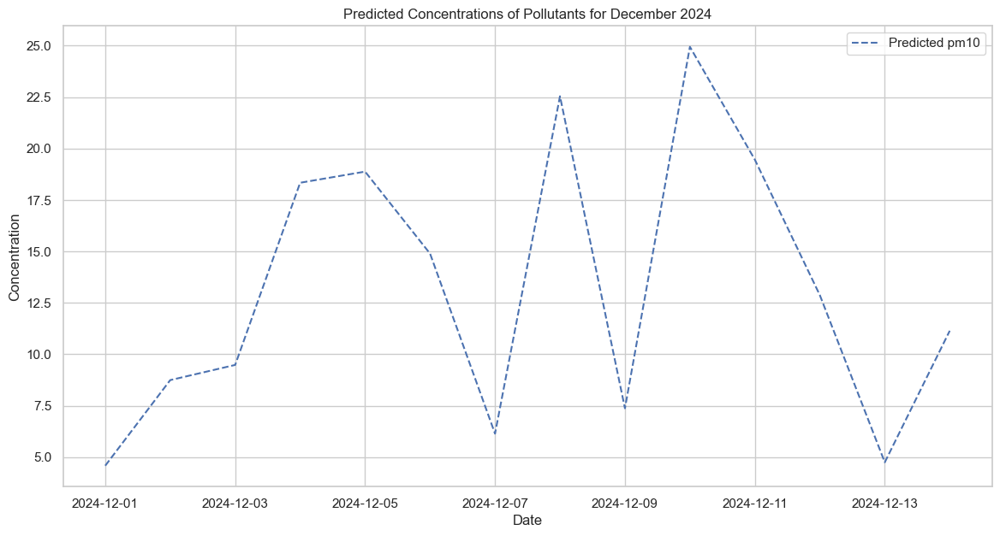

In [69]:
#Faire les prédictions et Visualisation des résultats
predictions = pd.DataFrame(index=future_features.index) 
for target, model in rf_models.items():
    predictions[target]=model.predict(future_features)
plt.figure(figsize=(14, 7)) 
for column in targets.columns:
    plt.plot(predictions.index, predictions[column], label=f'Predicted {column}', linestyle='--')
    plt.title('Predicted Concentrations of Pollutants for December 2024')
    plt.xlabel('Date')
    plt.ylabel('Concentration')
    plt.legend()
    plt.grid(True)
    plt.show()

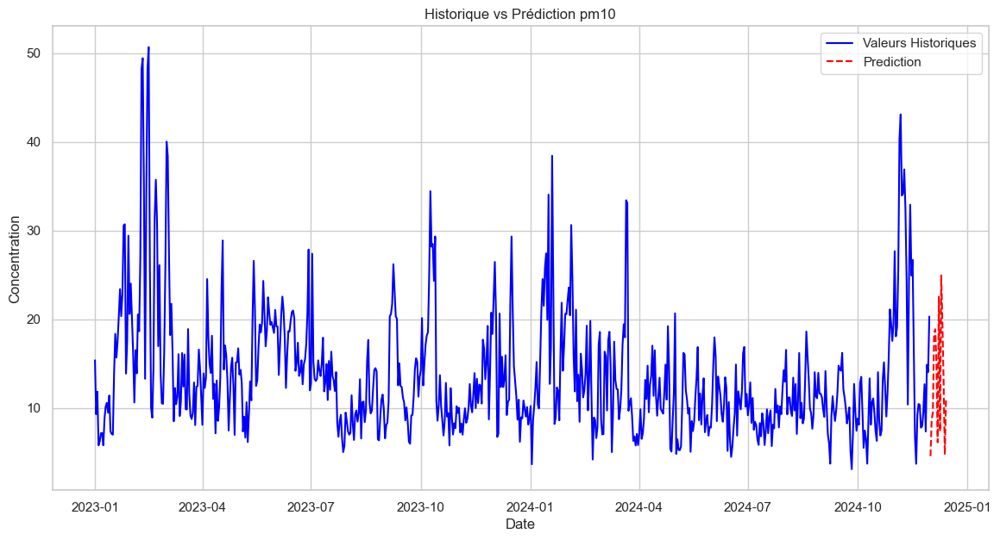

In [70]:
new_data = future_features.copy()
for target, model in rf_models.items():
    new_data[target] = model.predict(future_features)
combined_data = pd.concat([df_idf2[['day', 'pm10']], new_data.reset_index()])
plt.figure(figsize=(14,7))
plt.plot(df_idf2['day'], df_idf2['pm10'], label=f'Valeurs Historiques',color='blue')
plt.plot(new_data.index, new_data[column], label=f'Prediction', linestyle='--', color= 'red')
plt.title('Historique vs Prédiction pm10')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.show() 
 

En comparant les prédictions effectuées, les deux modèles prédisent une baisse des taux de pm10 dans l'air vers la fin de la période des prédictions (limitée au 14 Décembre 2024). Ceci est potentiellement liée à des prévisions de hausse de précipitations et de vitesse de l'air qui ont généralement tendance à nettoyer l'air en éléminant les particules en suspension, et le froid durant cette saison qui favorise la stagnation de l'air et limite la dispersion des polluants

Dans ce qui suit on vérifie la justesse de ces hypothèses en examinant la contributions de chaque variable explicative dans les prédictions du modèle

# Pertinence des variables explicatives


In [38]:
pertinence= rf.feature_importances_
colonnes= X_train.columns
coeff_pm10=pd.Series(pertinence, colonnes)

In [39]:
coeff_pm10

sulphur_dioxide         0.012365
pm2_5                   0.909409
nitrogen_dioxide        0.009765
ozone                   0.006121
temperature_2m          0.011879
relative_humidity_2m    0.031915
precipitation           0.004355
surface_pressure        0.006338
wind_speed_10m          0.007853
dtype: float64

Chaque coefficient indique à quel point chaque variable explicative contribue à la réduction de l'erreur dans les prédictions.
On peut clairement voir que la variable pm2_5 domine les autres variables explicatives, ce qui peut être expliqué par les sources communes des deux types de particules proviennent souvent des mêmes sources, telles que les émissions des véhicules, les industries, les feux de bois, les activités de construction et l'agriculture. Ainsi, il existe une forte corrélation entre les concentrations de PM2.5 et de PM10.

## Prédiction de la concentration du pm2_5



In [64]:
#Séparation des variables features et targets
features = train_data[['sulphur_dioxide', 'pm10', 'nitrogen_dioxide', 'ozone', 'temperature_2m', 
               'relative_humidity_2m', 'precipitation', 'surface_pressure', 'wind_speed_10m']]
targets = train_data[['pm2_5']]
#Entraînement du modèle
rf_models = {} 
for target in targets.columns:
    X_train, X_test, y_train, y_test = train_test_split(features, targets[target], test_size=0.2, random_state=42)
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    rf_models[target] = rf

    
    # Prédiction sur l'ensemble de test et calcul du R²
    y_pred = rf.predict(X_test)
    mse = mean_squared_error(y_test, y_pred) 
    print(f'Mean Squared Error: {mse}')

#Génération des données synthétiques en se basant sur les données passées
future_features = pd.DataFrame({
    'sulphur_dioxide': np.random.normal(features['sulphur_dioxide'].mean(), features['sulphur_dioxide'].std(), 14),
    'pm10': np.random.normal(features['pm10'].mean(), features['pm10'].std(), 14),
    'nitrogen_dioxide': np.random.normal(features['nitrogen_dioxide'].mean(), features['nitrogen_dioxide'].std(), 14),
    'ozone': np.random.normal(features['ozone'].mean(), features['ozone'].std(), 14),
    'temperature_2m': np.random.normal(features['temperature_2m'].mean(), features['temperature_2m'].std(), 14),
    'relative_humidity_2m': np.random.normal(features['relative_humidity_2m'].mean(), features['relative_humidity_2m'].std(), 14),
    'precipitation': np.random.normal(features['precipitation'].mean(), features['precipitation'].std(), 14),
    'surface_pressure': np.random.normal(features['surface_pressure'].mean(), features['surface_pressure'].std(), 14),
    'wind_speed_10m': np.random.normal(features['wind_speed_10m'].mean(), features['wind_speed_10m'].std(), 14)},
    index=pd.date_range(start='2024-12-01', end='2024-12-14'))

Mean Squared Error: 3.079836642586


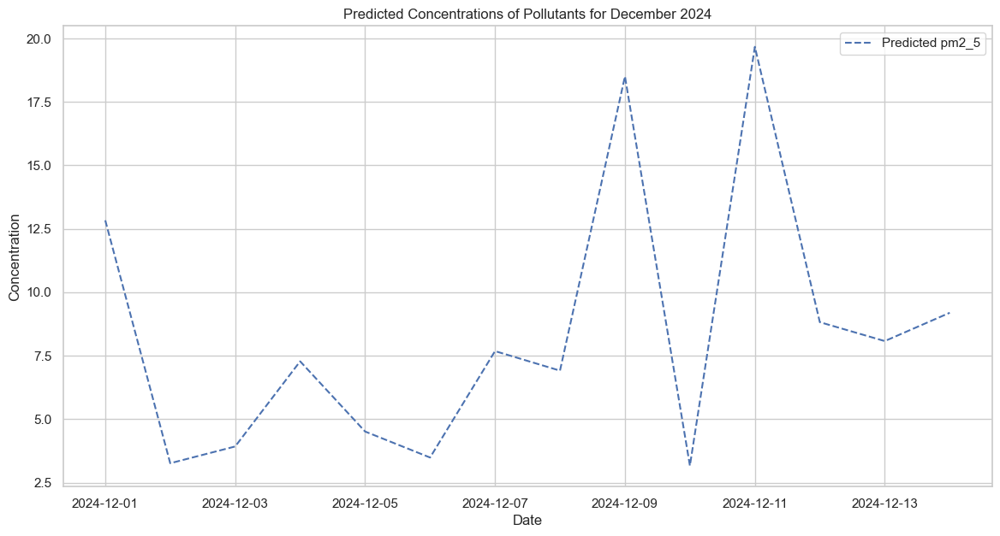

In [42]:
#Faire les prédictions et Visualisation des résultats
predictions = pd.DataFrame(index=future_features.index) 
for target, model in rf_models.items():
    predictions[target]=model.predict(future_features)
plt.figure(figsize=(14, 7)) 
for column in targets.columns:
    plt.plot(predictions.index, predictions[column], label=f'Predicted {column}', linestyle='--')
    plt.title('Predicted Concentrations of Pollutants for December 2024')
    plt.xlabel('Date')
    plt.ylabel('Concentration')
    plt.legend()
    plt.grid(True)
    plt.show()

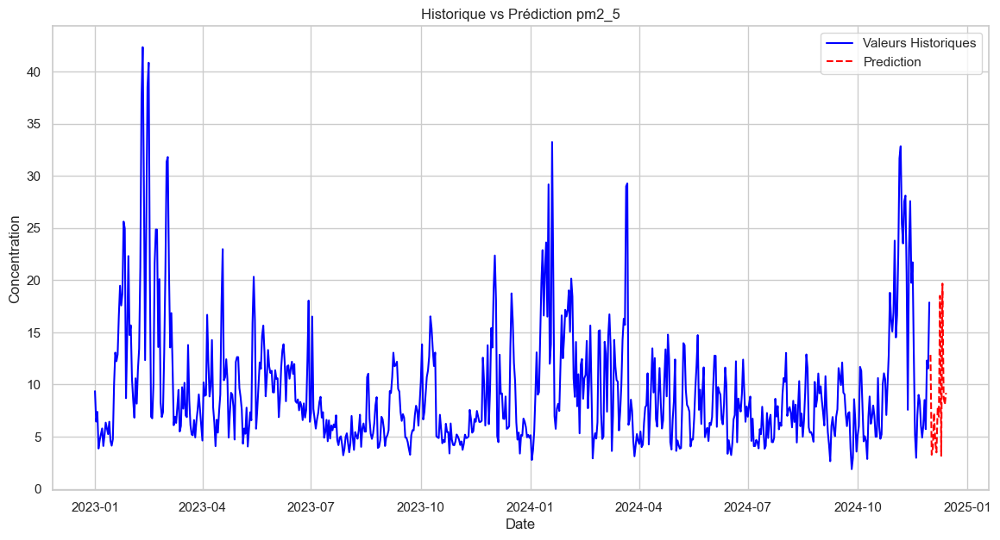

In [43]:
new_data = future_features.copy()
for target, model in rf_models.items():
    new_data[target] = model.predict(future_features)
combined_data = pd.concat([df_idf2[['day', 'pm2_5']], new_data.reset_index()])
plt.figure(figsize=(14,7))
plt.plot(df_idf2['day'], df_idf2['pm2_5'], label=f'Valeurs Historiques',color='blue')
plt.plot(new_data.index, new_data[column], label=f'Prediction', linestyle='--', color= 'red')
plt.title('Historique vs Prédiction pm2_5')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.show() 

De même, le modèle prédit une baisse des taux de pm2_5 par rapport à l'automne 2024, bien en corrélation avec les prédictions ARIMA.


# Pertinence des variables explicatives


In [44]:
pertinence= rf.feature_importances_
colonnes= X_train.columns
coeff_pm2_5=pd.Series(pertinence, colonnes)

In [45]:
coeff_pm2_5

sulphur_dioxide         0.005493
pm10                    0.911551
nitrogen_dioxide        0.007445
ozone                   0.008593
temperature_2m          0.032975
relative_humidity_2m    0.015365
precipitation           0.002719
surface_pressure        0.007115
wind_speed_10m          0.008745
dtype: float64

Il était attendu de remarquer la forte importance de pm10 dans la prédiction de pm2.5, et qui domie clairement toutes les autres variables, pour les mêmes raisons citées ci-dessus.

## Prédiction de la concentration d'ozone




Mean Squared Error: 75.75036458510272


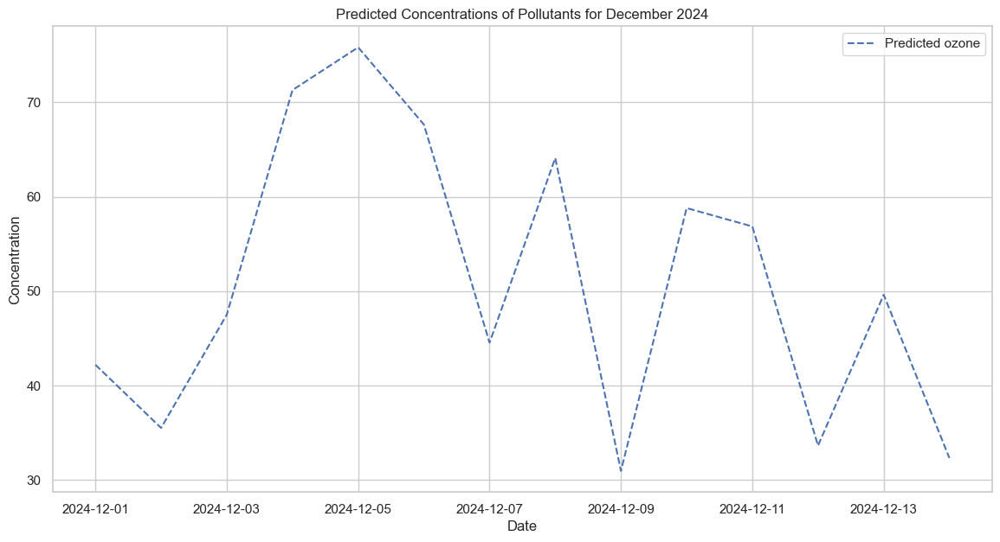

In [72]:
#Séparation des variables features et targets
features = train_data[['sulphur_dioxide', 'pm10', 'nitrogen_dioxide', 'pm2_5', 'temperature_2m', 
               'relative_humidity_2m', 'precipitation', 'surface_pressure', 'wind_speed_10m']]
targets = train_data[['ozone']]
#Entraînement du modèle
rf_models = {} 
for target in targets.columns:
    X_train, X_test, y_train, y_test = train_test_split(features, targets[target], test_size=0.2, random_state=42)
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    rf_models[target] = rf

        
    # Prédiction sur l'ensemble de test et calcul du R²
    y_pred = rf.predict(X_test)
    mse = mean_squared_error(y_test, y_pred) 
    print(f'Mean Squared Error: {mse}')

#Génération des données synthétiques en se basant sur les données passées
future_features = pd.DataFrame({
    'sulphur_dioxide': np.random.normal(features['sulphur_dioxide'].mean(), features['sulphur_dioxide'].std(), 14),
    'pm10': np.random.normal(features['pm10'].mean(), features['pm10'].std(), 14),
    'nitrogen_dioxide': np.random.normal(features['nitrogen_dioxide'].mean(), features['nitrogen_dioxide'].std(), 14),
    'pm2_5': np.random.normal(features['pm2_5'].mean(), features['pm2_5'].std(), 14),
    'temperature_2m': np.random.normal(features['temperature_2m'].mean(), features['temperature_2m'].std(), 14),
    'relative_humidity_2m': np.random.normal(features['relative_humidity_2m'].mean(), features['relative_humidity_2m'].std(), 14),
    'precipitation': np.random.normal(features['precipitation'].mean(), features['precipitation'].std(), 14),
    'surface_pressure': np.random.normal(features['surface_pressure'].mean(), features['surface_pressure'].std(), 14),
    'wind_speed_10m': np.random.normal(features['wind_speed_10m'].mean(), features['wind_speed_10m'].std(), 14)},
    index=pd.date_range(start='2024-12-01', end='2024-12-14'))

#Faire les prédictions et Visualisation des résultats
predictions = pd.DataFrame(index=future_features.index) 
for target, model in rf_models.items():
    predictions[target]=model.predict(future_features)
plt.figure(figsize=(14, 7)) 
for column in targets.columns:
    plt.plot(predictions.index, predictions[column], label=f'Predicted {column}', linestyle='--')
    plt.title('Predicted Concentrations of Pollutants for December 2024')
    plt.xlabel('Date')
    plt.ylabel('Concentration')
    plt.legend()
    plt.grid(True)
    plt.show()

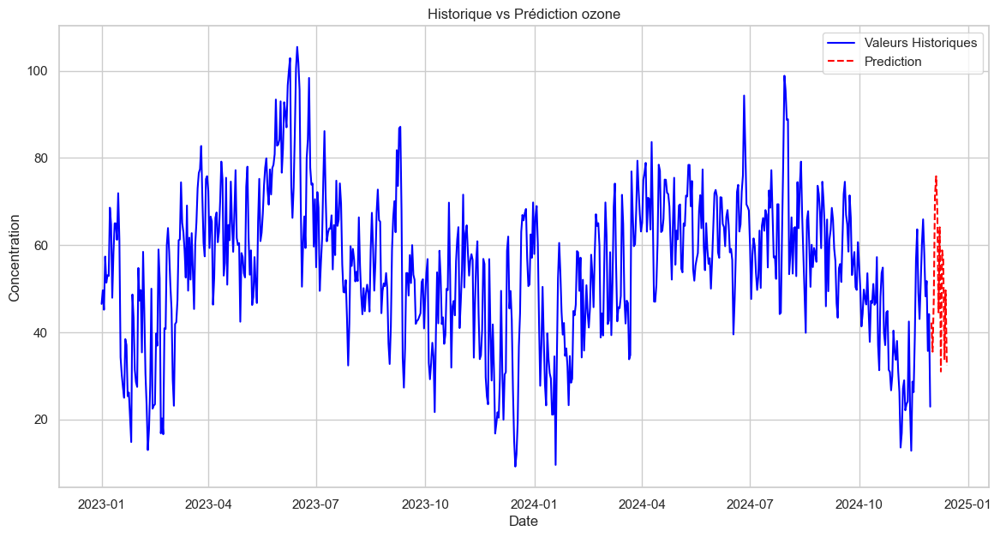

In [73]:
new_data = future_features.copy()
for target, model in rf_models.items():
    new_data[target] = model.predict(future_features)
combined_data = pd.concat([df_idf2[['day', 'ozone']], new_data.reset_index()])
plt.figure(figsize=(14,7))
plt.plot(df_idf2['day'], df_idf2['ozone'], label=f'Valeurs Historiques',color='blue')
plt.plot(new_data.index, new_data[column], label=f'Prediction', linestyle='--', color= 'red')
plt.title('Historique vs Prédiction ozone')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.show() 

Dans cette occasion, notre le modèle de forêts aléatoires prédit plutôt une baisse vers la fin de la période, après une hausse au début. Tandis que le modèle ARIMA prédit une hausse constante de la concentration d'ozone.
En étudiant la pertinence des variables explicatives dans le modèle random forest, on espère pouvoir trancher quant à ces différences.

## Pertinence des Variables explicatives


In [74]:
pertinence= rf.feature_importances_
colonnes= X_train.columns
coeff_ozone=pd.Series(pertinence, colonnes)

In [75]:
coeff_ozone

sulphur_dioxide         0.030572
pm10                    0.042863
nitrogen_dioxide        0.570895
pm2_5                   0.073646
temperature_2m          0.063668
relative_humidity_2m    0.148730
precipitation           0.015642
surface_pressure        0.023442
wind_speed_10m          0.030543
dtype: float64

Le dioxyde d'Azote a une grande importance dans la modélisation avec un coeeficient de 57%, puisque le premier se forme principalement à travers des réactions photochimiques impliquant les oxydes d'azote. De plus, une fois formé, l'ozone peut réagir avec l'oxyde d'Azote pour reformer du le dioxyde d'Azote ce qui peut expliquer cette forte corrélation.
L'humidité a quant à elle une grande importance dans le modèle, puisque par temps humide, la dispersion des polluants peut être réduite, et elle peut favoriser la formation de particules solides qui bloquent la dispersion des gazs polluants.


# Prédiction de la concentration du dioxyde d'Azote


Mean Squared Error: 7.32038576876061


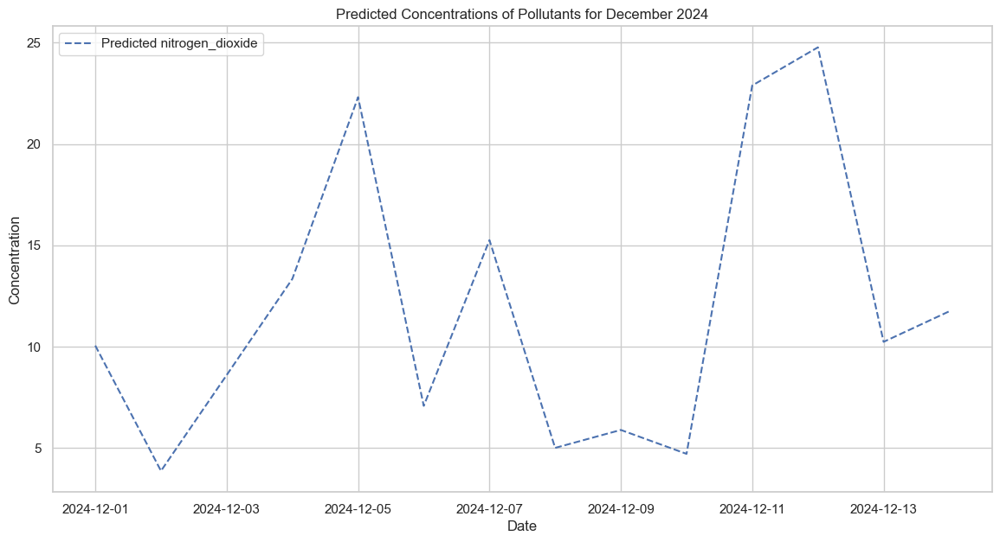

In [82]:
#Séparation des variables features et targets
features = train_data[['sulphur_dioxide', 'pm10', 'ozone', 'pm2_5', 'temperature_2m', 
               'relative_humidity_2m', 'precipitation', 'surface_pressure', 'wind_speed_10m']]
targets = train_data[['nitrogen_dioxide']]
#Entraînement du modèle
rf_models = {} 
for target in targets.columns:
    X_train, X_test, y_train, y_test = train_test_split(features, targets[target], test_size=0.2, random_state=42)
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    rf_models[target] = rf

    
    # Prédiction sur l'ensemble de test et calcul du R²
    y_pred = rf.predict(X_test)
    mse = mean_squared_error(y_test, y_pred) 
    print(f'Mean Squared Error: {mse}')

#Génération des données synthétiques en se basant sur les données passées
future_features = pd.DataFrame({
    'sulphur_dioxide': np.random.normal(features['sulphur_dioxide'].mean(), features['sulphur_dioxide'].std(), 14),
    'pm10': np.random.normal(features['pm10'].mean(), features['pm10'].std(), 14),
    'ozone': np.random.normal(features['ozone'].mean(), features['ozone'].std(), 14),
    'pm2_5': np.random.normal(features['pm2_5'].mean(), features['pm2_5'].std(), 14),
    'temperature_2m': np.random.normal(features['temperature_2m'].mean(), features['temperature_2m'].std(), 14),
    'relative_humidity_2m': np.random.normal(features['relative_humidity_2m'].mean(), features['relative_humidity_2m'].std(), 14),
    'precipitation': np.random.normal(features['precipitation'].mean(), features['precipitation'].std(), 14),
    'surface_pressure': np.random.normal(features['surface_pressure'].mean(), features['surface_pressure'].std(), 14),
    'wind_speed_10m': np.random.normal(features['wind_speed_10m'].mean(), features['wind_speed_10m'].std(), 14)},
    index=pd.date_range(start='2024-12-01', end='2024-12-14'))

#Faire les prédictions et Visualisation des résultats
predictions = pd.DataFrame(index=future_features.index) 
for target, model in rf_models.items():
    predictions[target]=model.predict(future_features)
plt.figure(figsize=(14, 7)) 
for column in targets.columns:
    plt.plot(predictions.index, predictions[column], label=f'Predicted {column}', linestyle='--')
    plt.title('Predicted Concentrations of Pollutants for December 2024')
    plt.xlabel('Date')
    plt.ylabel('Concentration')
    plt.legend()
    plt.grid(True)
    plt.show()

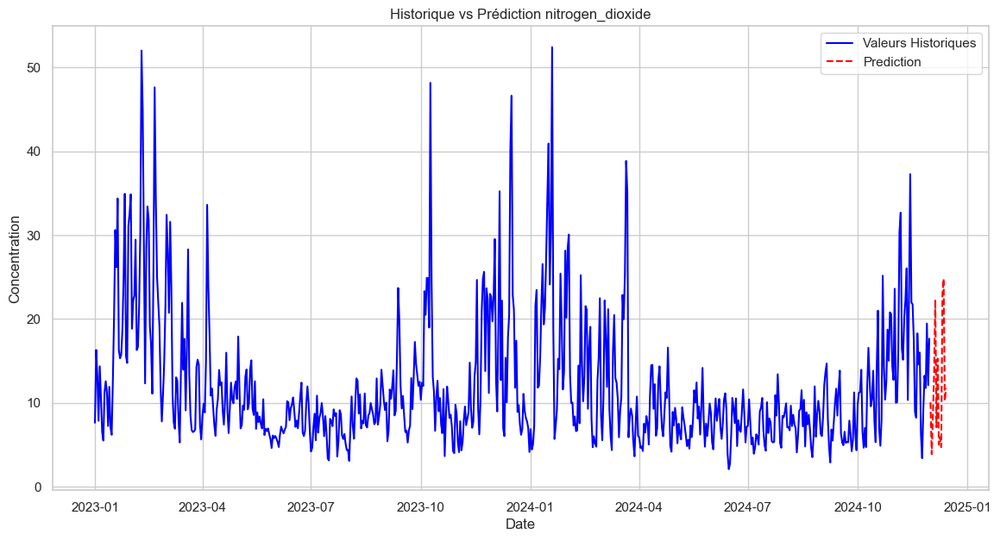

In [83]:
new_data = future_features.copy()
for target, model in rf_models.items():
    new_data[target] = model.predict(future_features)
combined_data = pd.concat([df_idf2[['day', 'nitrogen_dioxide']], new_data.reset_index()])
plt.figure(figsize=(14,7))
plt.plot(df_idf2['day'], df_idf2['nitrogen_dioxide'], label=f'Valeurs Historiques',color='blue')
plt.plot(new_data.index, new_data[column], label=f'Prediction', linestyle='--', color= 'red')
plt.title('Historique vs Prédiction nitrogen_dioxide')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.show() 

La baisse générale des concentrations des gazs durant cette période froide était attendu, et ceci est en accord avec les prévisions du modèle ARIMA.

## Pertinence des variables explicatives

In [84]:
pertinence= rf.feature_importances_
colonnes= X_train.columns
coeff_nitro=pd.Series(pertinence, colonnes)

In [85]:
coeff_nitro

sulphur_dioxide         0.793350
pm10                    0.021349
ozone                   0.117444
pm2_5                   0.012092
temperature_2m          0.013893
relative_humidity_2m    0.011468
precipitation           0.004217
surface_pressure        0.009055
wind_speed_10m          0.017132
dtype: float64

La corrélation Ozone/Dioxyde d'Azote était bien attendue, mais est quand même importée par l'importance du dioxyde de sulphate dans la prédiction du dernier. Cela est tout simplement expliqué par les sources d'émissions qui sont similaires, comme les combustibles fossiles

## Prédiction de la concentration du sulphure dioxide


In [86]:
#Séparation des variables features et targets
features = train_data[['pm10', 'pm2_5', 'nitrogen_dioxide', 'ozone', 'temperature_2m', 
               'relative_humidity_2m', 'precipitation', 'surface_pressure', 'wind_speed_10m']]
targets = train_data[['sulphur_dioxide']]
#Entraînement du modèle
rf_models = {} 
for target in targets.columns:
    X_train, X_test, y_train, y_test = train_test_split(features, targets[target], test_size=0.2, random_state=42)
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    rf_models[target] = rf
    
        
    # Prédiction sur l'ensemble de test et calcul du R²
    y_pred = rf.predict(X_test)
    mse = mean_squared_error(y_test, y_pred) 
    print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.0748223908213526


In [87]:

#Génération des données synthétiques en se basant sur les données passées
future_features = pd.DataFrame({
    'pm10': np.random.normal(features['pm10'].mean(), features['pm10'].std(), 14),
    'pm2_5': np.random.normal(features['pm2_5'].mean(), features['pm2_5'].std(), 14),
    'nitrogen_dioxide': np.random.normal(features['nitrogen_dioxide'].mean(), features['nitrogen_dioxide'].std(), 14),
    'ozone': np.random.normal(features['ozone'].mean(), features['ozone'].std(), 14),
    'temperature_2m': np.random.normal(features['temperature_2m'].mean(), features['temperature_2m'].std(), 14),
    'relative_humidity_2m': np.random.normal(features['relative_humidity_2m'].mean(), features['relative_humidity_2m'].std(), 14),
    'precipitation': np.random.normal(features['precipitation'].mean(), features['precipitation'].std(), 14),
    'surface_pressure': np.random.normal(features['surface_pressure'].mean(), features['surface_pressure'].std(), 14),
    'wind_speed_10m': np.random.normal(features['wind_speed_10m'].mean(), features['wind_speed_10m'].std(), 14)},
    index=pd.date_range(start='2024-12-01', end='2024-12-14'))



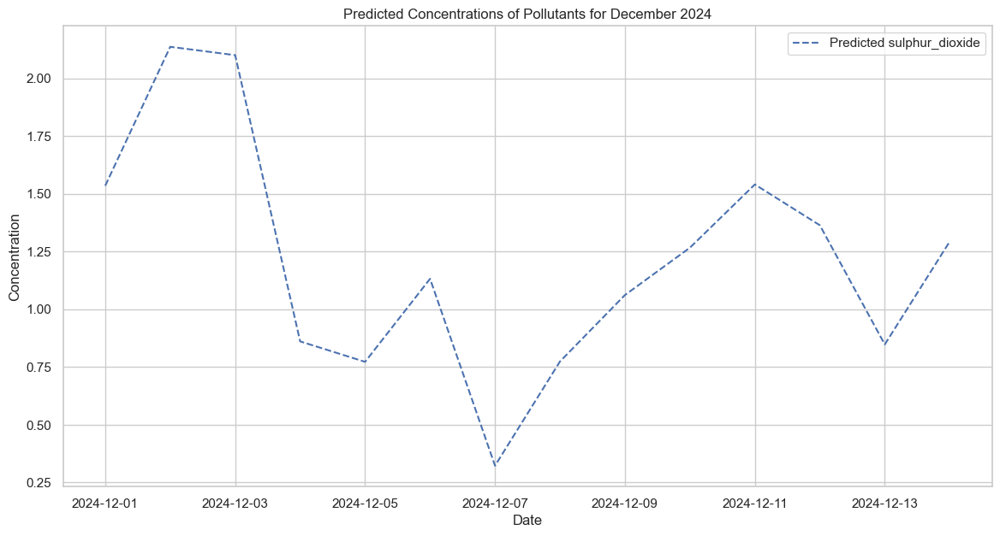

In [88]:

#Faire les prédictions et Visualisation des résultats
predictions = pd.DataFrame(index=future_features.index) 
for target, model in rf_models.items():
    predictions[target]=model.predict(future_features)
plt.figure(figsize=(14, 7)) 
for column in targets.columns:
    plt.plot(predictions.index, predictions[column], label=f'Predicted {column}', linestyle='--')
    plt.title('Predicted Concentrations of Pollutants for December 2024')
    plt.xlabel('Date')
    plt.ylabel('Concentration')
    plt.legend()
    plt.grid(True)
    plt.show()

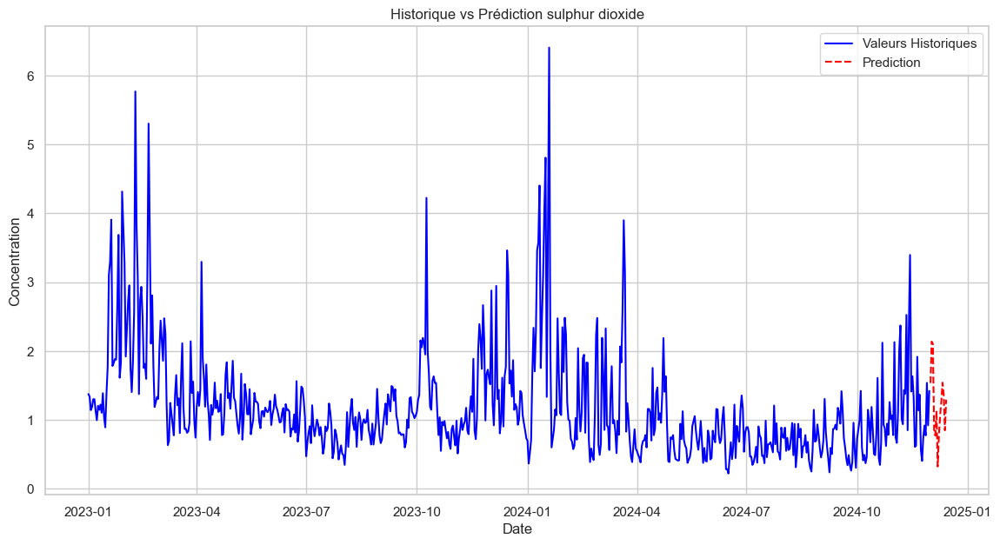

In [89]:
new_data = future_features.copy()
for target, model in rf_models.items():
    new_data[target] = model.predict(future_features)
combined_data = pd.concat([df_idf2[['day', 'sulphur_dioxide']], new_data.reset_index()])
plt.figure(figsize=(14,7))
plt.plot(df_idf2['day'], df_idf2['sulphur_dioxide'], label=f'Valeurs Historiques',color='blue')
plt.plot(new_data.index, new_data[column], label=f'Prediction', linestyle='--', color= 'red')
plt.title('Historique vs Prédiction sulphur dioxide')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.show() 
 


Toujours en cohérence avec le modèle ARIMA, une baisse des concentrations de ce gaz polluant était bien attendu.
L'étude de l'importance dans la modélisation des variables explicatives va nous permettre de comprendre pourquoi c'est le cas

# Pertinence des variables explicatives

In [92]:
pertinence= rf.feature_importances_
colonnes= X_train.columns
coeff_sulph=pd.Series(pertinence, colonnes)

In [91]:
coeff_sulph

pm10                    0.029574
pm2_5                   0.009616
nitrogen_dioxide        0.841129
ozone                   0.015437
temperature_2m          0.044659
relative_humidity_2m    0.022191
precipitation           0.007602
surface_pressure        0.015517
wind_speed_10m          0.014275
dtype: float64

La corrélation NO2/SO2 était bien attendue, vu leurs sources similaires, mais il était suprenant de voir que d'autres variables sont plus pertinentes que l'Ozone dans la modélisation, pourtant ce dernier est corrélé avec NO2.

## Comparaison des modèles

| RMSE Modele      | pm10   | pm2_5  | ozone  | nitrogen_dioxide | sulphur_dioxide |
|----------------|---------|--------|--------|------------------|-----------------|
| ARIMA          | 11.936 | 11.722 | 20.763 | 12.009           | 1.286           |
| RFM          | 4.418 | 3.079 | 75.750 | 7.320        | 0.0748         |


En général, le modèle ARIMA a une meilleure capacité explicative et prédit mieux les variables cibles (sauf pour l'ozone), et permet d'expliquer une grande partie de la variance des données.
Pour l'ozone, on a pu remarquer que les deux modèles prédisent des tendances d'évolutions contradictoires, pourtant $R^2$ pour le modèle des forêts aléatoires est très proche de 1, ce qui peut indiquer un surajustement, mais ces problèmes sont bien gérés par le modèle. 
La capacité explicative faible du modèle de forêts aléatoires est probablement dû à la méthode de génération de données synthétiques à travers les distributions passées des variables explicatives. Cette méthode repose sur l'hypothèse que les futures distributions de features seront similaires à celles du passé et donc cela peut ne pas capturerles événements extrêmes non observés dans les données passées, comme des conditions météorologiques anormales, et donc cela peut ne pas bien détecter les corrélations complexes entre les variables explicatives